# (A) Dependencies
- It just need the libraries. There is no further installation dependency.
- You can download and load the dataset via seaborn library.

## Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# (B) Dataset

## Getting the Dataset

### Downloading the dataset via kaggle api
- [Kaggle  Dataset](https://www.kaggle.com/datasets/altruistdelhite04/loan-prediction-problem-dataset)

In [2]:
# Download kaggle api
!pip install -q kaggle

In [3]:
# Creat the convenient dir for token. (The system will seach this dir)
! mkdir ~/.kaggle

- Upload your kaggle token
- For creating a token
  - Sign in your Kaggle account,
  - Open Account section from  your icon menu
  - Scroll to API section
  -  Click on __Create New API Token__
     - It will download kaggle.json file on your machine. 
  - Upload this kaggle.json file into your working directory on your google colab session.
  - Run floowing codes

In [4]:
# upload your kaggle token to download dataset.
from google.colab import files
files.upload();

Saving kaggle.json to kaggle.json


In [5]:
# Copy the json file into correct path, then remove the firt one it
! cp kaggle.json ~/.kaggle/
! rm -f kaggle.json

In [6]:
# Set the token can't readable for other user if you save it somewhere
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
# Download your data "Competition-name"
#! kaggle competitions download -c 'competition-name'
!kaggle datasets download -d altruistdelhite04/loan-prediction-problem-dataset

  0% 0.00/12.6k [00:00<?, ?B/s]
100% 12.6k/12.6k [00:00<00:00, 12.9MB/s]


In [8]:
!unzip loan-prediction-problem-dataset.zip

Archive:  loan-prediction-problem-dataset.zip
  inflating: test_Y3wMUE5_7gLdaTN.csv  
  inflating: train_u6lujuX_CVtuZ9i.csv  


In [9]:
!ls

loan-prediction-problem-dataset.zip  test_Y3wMUE5_7gLdaTN.csv
sample_data			     train_u6lujuX_CVtuZ9i.csv


### Loading the dataset

In [10]:
ds_path = "/content/train_u6lujuX_CVtuZ9i.csv"
untagged_ds_path = "/content/test_Y3wMUE5_7gLdaTN.csv"

In [11]:
raw = pd.read_csv(ds_path)
df = raw.copy()

unlabelled_data= pd.read_csv(untagged_ds_path)

In [12]:
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


In [13]:
unlabelled_data.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
1,LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban
2,LP001031,Male,Yes,2,Graduate,No,5000,1800,208.0,360.0,1.0,Urban
3,LP001035,Male,Yes,2,Graduate,No,2340,2546,100.0,360.0,NaN,Urban
4,LP001051,Male,No,0,Not Graduate,No,3276,0,78.0,360.0,1.0,Urban


### Meta Data of The Dataset

  - Dream Housing Finance company deals in all home loans. 
    - They have presence across all urban, semi urban and rural areas. 
  - Customer first apply for home loan after that company validates the customer eligibility for loan.
  - __Company wants to automate the loan eligibility process (real time)__ based on customer detail provided while filling online application form.
    - These details are
      - Gender
      - Marital Status
      - Education
      - Number of Dependents
      - Income, Loan Amount
      - Credit History and others.
  - To automate this process, 
    - they have given a __problem to identify the customers segments__, 
      - those are eligible for loan amount so that they can specifically target these customers.
   
- This is a standard supervised classification task.
  - A classification problem where we have to __predict__ whether a __loan__ would be
    - __approved or not__.

Below is the dataset attributes with description.
   
Variable | Description
----------|--------------
Loan_ID | Unique Loan ID
Gender | Male/ Female
Married | Applicant married (Y/N)
Dependents | Number of dependents
Education | Applicant Education (Graduate/ Under Graduate)
Self_Employed | Self employed (Y/N)
ApplicantIncome | Applicant income
CoapplicantIncome | Coapplicant income
LoanAmount | Loan amount in thousands
Loan_Amount_Term | Term of loan in months
Credit_History | credit history meets guidelines
Property_Area | Urban/ Semi Urban/ Rural
Loan_Status | Loan approved (Y/N)

### Attributes & Stats of the dataset

In [14]:
# Dataset information (record size, variables, non-null counts, dtypes  etc...)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [15]:
# Descriptive stats of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ApplicantIncome,614.0,5403.459283,6109.041673,150.0,2877.5,3812.5,5795.00,81000.0
CoapplicantIncome,614.0,1621.245798,2926.248369,0.0,0.0,1188.5,2297.25,41667.0
LoanAmount,592.0,146.412162,85.587325,9.0,100.0,128.0,168.00,700.0
Loan_Amount_Term,600.0,342.000000,65.120410,12.0,360.0,360.0,360.00,480.0
Credit_History,564.0,0.842199,0.364878,0.0,1.0,1.0,1.00,1.0


In [16]:
# Distribution of target variable's classes
df["Loan_Status"].value_counts()

Y    422
N    192
Name: Loan_Status, dtype: int64

# (C) Preprocessing the dataset

## Adjusting data types

### Type Casting on target classes from object to categorical 

In [17]:
cat_cols = df.select_dtypes(include=["object"]).columns
cat_cols

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'Property_Area', 'Loan_Status'],
      dtype='object')

In [18]:
num_cols = df.select_dtypes(include=["int64","float64"]).columns
num_cols

Index(['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History'],
      dtype='object')

In [19]:
 df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Loan_ID        614 non-null    object
 1   Gender         601 non-null    object
 2   Married        611 non-null    object
 3   Dependents     599 non-null    object
 4   Education      614 non-null    object
 5   Self_Employed  582 non-null    object
 6   Property_Area  614 non-null    object
 7   Loan_Status    614 non-null    object
dtypes: object(8)
memory usage: 38.5+ KB


In [20]:
 df[cat_cols] = df[cat_cols].astype('category')

In [21]:
 df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Loan_ID        614 non-null    category
 1   Gender         601 non-null    category
 2   Married        611 non-null    category
 3   Dependents     599 non-null    category
 4   Education      614 non-null    category
 5   Self_Employed  582 non-null    category
 6   Property_Area  614 non-null    category
 7   Loan_Status    614 non-null    category
dtypes: category(8)
memory usage: 27.4 KB


In [22]:
for col in cat_cols:
  print(f"{col}: ", df[col].unique(), end="\n"*2)

Loan_ID:  ['LP001002', 'LP001003', 'LP001005', 'LP001006', 'LP001008', ..., 'LP002978', 'LP002979', 'LP002983', 'LP002984', 'LP002990']
Length: 614
Categories (614, object): ['LP001002', 'LP001003', 'LP001005', 'LP001006', ..., 'LP002979',
                           'LP002983', 'LP002984', 'LP002990']

Gender:  ['Male', 'Female', NaN]
Categories (2, object): ['Female', 'Male']

Married:  ['No', 'Yes', NaN]
Categories (2, object): ['No', 'Yes']

Dependents:  ['0', '1', '2', '3+', NaN]
Categories (4, object): ['0', '1', '2', '3+']

Education:  ['Graduate', 'Not Graduate']
Categories (2, object): ['Graduate', 'Not Graduate']

Self_Employed:  ['No', 'Yes', NaN]
Categories (2, object): ['No', 'Yes']

Property_Area:  ['Urban', 'Rural', 'Semiurban']
Categories (3, object): ['Rural', 'Semiurban', 'Urban']

Loan_Status:  ['Y', 'N']
Categories (2, object): ['N', 'Y']



### Grouping by dtypes
Grouping dataset according to numerical and categorical for further process

In [23]:
df_num = df.select_dtypes(include=["float64","int64"])
df_num.head(0)

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History


In [24]:
df_cat = df.select_dtypes(include=["category"])
df_cat.head(0)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,Property_Area,Loan_Status


## Feature Engineering

### Creation of new attributes 

In [25]:
def visual_compare(before:pd.Series, after:pd.Series, figsize:tuple=(20,5)):

  plt.figure(figsize=(20,5))

  plt.subplot(2,2,1)
  sns.distplot(before)

  plt.subplot(2,2,2)
  sns.boxplot(before)
  
  plt.subplot(2,2,3)
  sns.distplot(before)
  
  plt.subplot(2,2,4)
  sns.boxplot(after)


In [26]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [27]:
def outlier_ratio_compare(before:pd.Series, after:pd.Series, iqr_ratio:float=1.5):

  # calculating IQR to findout outliers
  b_l_th, b_h_th = IQR_calculator(before, ratio=iqr_ratio)[1:]
  a_l_th, a_h_th = IQR_calculator(after, ratio=iqr_ratio)[1:]

  # fidning out the outlier
  b_is_outlier = find_outlier_single(before, b_l_th, b_h_th)
  a_is_outlier = find_outlier_single(after, a_l_th, a_h_th)

  # calculating the outlier ratio through outlier count over total count.
  b_outlier_ratio = np.round(b_is_outlier.sum()/before.count(), 3)
  a_outlier_ratio = np.round(a_is_outlier.sum()/after.count(), 3)
  change = np.round(a_outlier_ratio - b_outlier_ratio, 3)

  return b_outlier_ratio, a_outlier_ratio, change

#### Via Summing

In [28]:
# total income
df['Total_Income'] = df['ApplicantIncome'] + df['CoapplicantIncome']

<Axes: xlabel='Total_Income', ylabel='Density'>

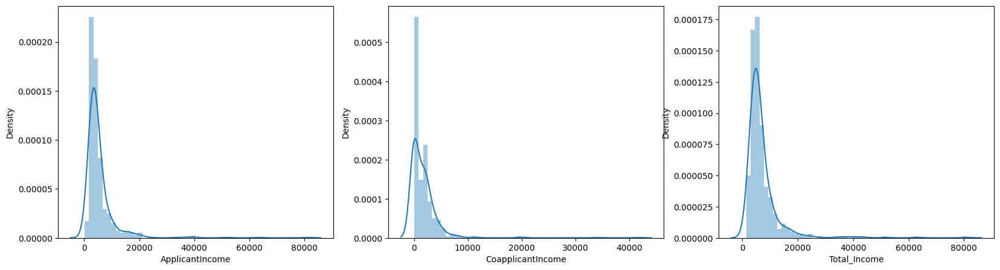

In [29]:
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
sns.distplot(df['ApplicantIncome'])

plt.subplot(1,3,2)
sns.distplot(df['CoapplicantIncome'])

plt.subplot(1,3,3)
sns.distplot(df['Total_Income'])

#### Via Log Transformation

In [30]:
df['ApplicantIncome_Log'] = np.log(df['ApplicantIncome']+1)
df['CoapplicantIncome_Log'] = np.log(df['CoapplicantIncome']+1)
df['LoanAmount_Log'] = np.log(df['LoanAmount']+1)
df['Loan_Amount_Term_Log'] = np.log(df['Loan_Amount_Term']+1)
df['Total_Income_Log'] = np.log(df['Total_Income']+1)

In [31]:
transformed_cols = [
    ("ApplicantIncome", "ApplicantIncome_Log"),
    ("CoapplicantIncome", "CoapplicantIncome_Log"),
    ("LoanAmount", "LoanAmount_Log"),
    ("Loan_Amount_Term", "Loan_Amount_Term_Log"),
    ("Total_Income", "Total_Income_Log"),
]

In [32]:
num_cols = df.select_dtypes(include=("int64", "float64")).columns

In [33]:
num_cols

Index(['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Total_Income',
       'ApplicantIncome_Log', 'CoapplicantIncome_Log', 'LoanAmount_Log',
       'Loan_Amount_Term_Log', 'Total_Income_Log'],
      dtype='object')

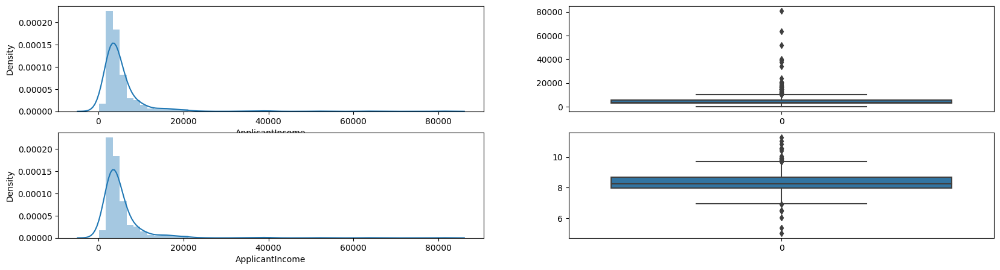

In [34]:
visual_compare(before = df["ApplicantIncome"], after = df['ApplicantIncome_Log'])

In [35]:
b, a, d= outlier_ratio_compare(before = df["ApplicantIncome"], after = df['ApplicantIncome_Log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.081
after outlier ratio: 0.044
changing: -0.037


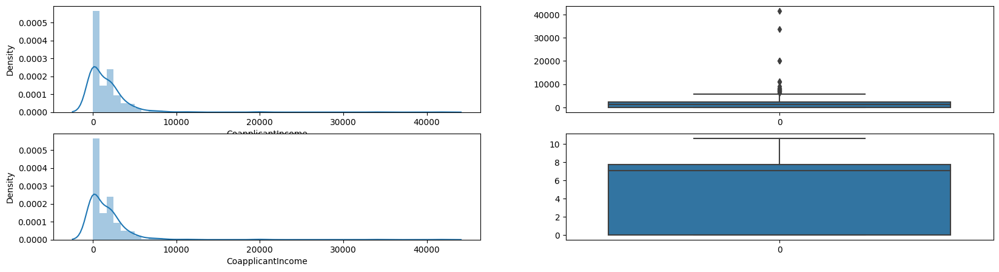

In [36]:
visual_compare(before = df["CoapplicantIncome"], after = df['CoapplicantIncome_Log'])

In [37]:
b, a, d= outlier_ratio_compare(before = df["CoapplicantIncome"], after = df['CoapplicantIncome_Log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.029
after outlier ratio: 0.0
changing: -0.029


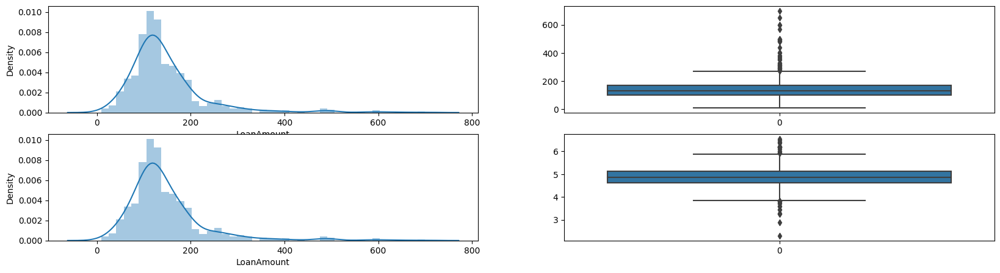

In [38]:
visual_compare(before = df["LoanAmount"], after = df['LoanAmount_Log'])

In [39]:
b, a, d= outlier_ratio_compare(before = df["LoanAmount"], after = df['LoanAmount_Log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.066
after outlier ratio: 0.057
changing: -0.009


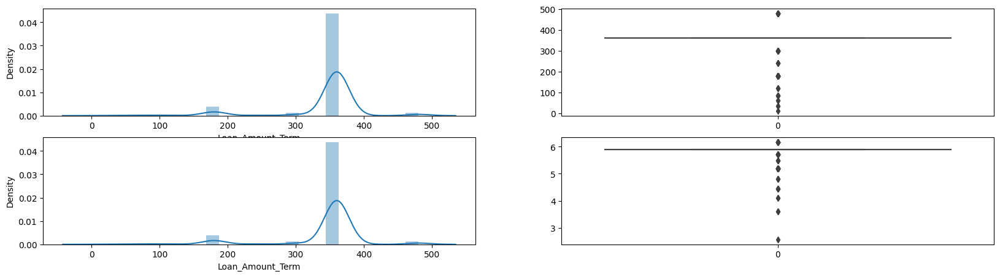

In [40]:
visual_compare(before = df["Loan_Amount_Term"], after = df['Loan_Amount_Term_Log'])

In [41]:
b, a, d= outlier_ratio_compare(before = df["Loan_Amount_Term"], after = df['Loan_Amount_Term_Log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.147
after outlier ratio: 0.147
changing: 0.0


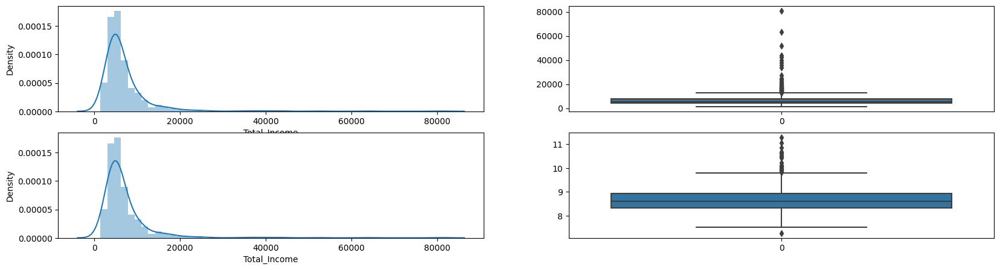

In [42]:
visual_compare(before = df["Total_Income"], after = df['Total_Income_Log'])

In [43]:
b, a, d= outlier_ratio_compare(before = df["Total_Income"], after = df['Total_Income_Log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.081
after outlier ratio: 0.036
changing: -0.045


### Adjusting the dataset according to new variables


In [44]:
# drop unnecessary columns
drop_cols = ['ApplicantIncome', 'CoapplicantIncome', "LoanAmount", "Loan_Amount_Term", "Total_Income", 'Loan_ID', 'CoapplicantIncome_Log']
df = df.drop(columns=drop_cols, axis=1)

In [45]:
df.columns

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'Loan_Status', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log'],
      dtype='object')

In [46]:
num_cols = list(df.select_dtypes(include=("int64", "float64")).columns)
cat_cols = [col for col in df.columns if col not in num_cols]

In [47]:
num_cols

['Credit_History',
 'ApplicantIncome_Log',
 'LoanAmount_Log',
 'Loan_Amount_Term_Log',
 'Total_Income_Log']

In [48]:
cat_cols

['Gender',
 'Married',
 'Dependents',
 'Education',
 'Self_Employed',
 'Property_Area',
 'Loan_Status']

## Missing Value

### Finding out the missing values

In [49]:
# find the null values
df.isnull().sum()

Gender                  13
Married                  3
Dependents              15
Education                0
Self_Employed           32
Credit_History          50
Property_Area            0
Loan_Status              0
ApplicantIncome_Log      0
LoanAmount_Log          22
Loan_Amount_Term_Log    14
Total_Income_Log         0
dtype: int64

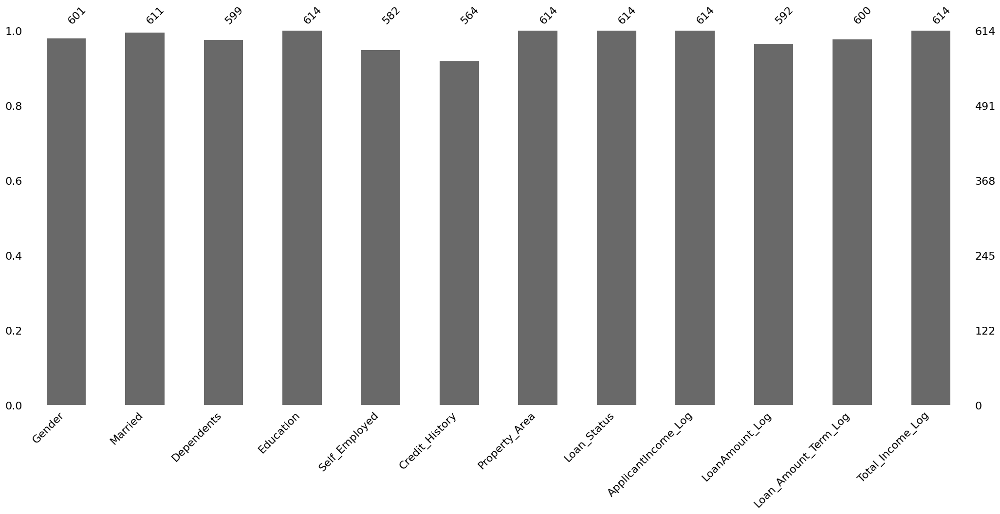

In [50]:
import missingno as msno
msno.bar(df);

<Axes: >

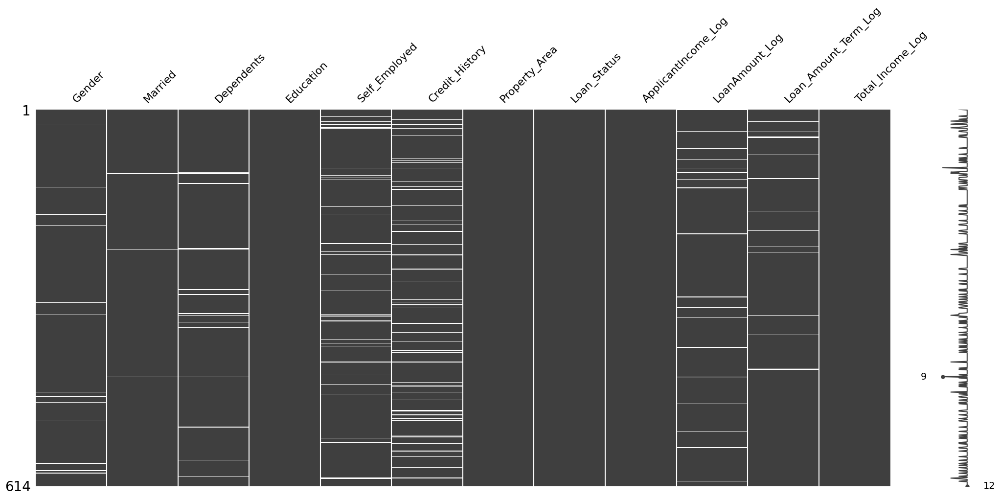

In [51]:
msno.matrix(df)

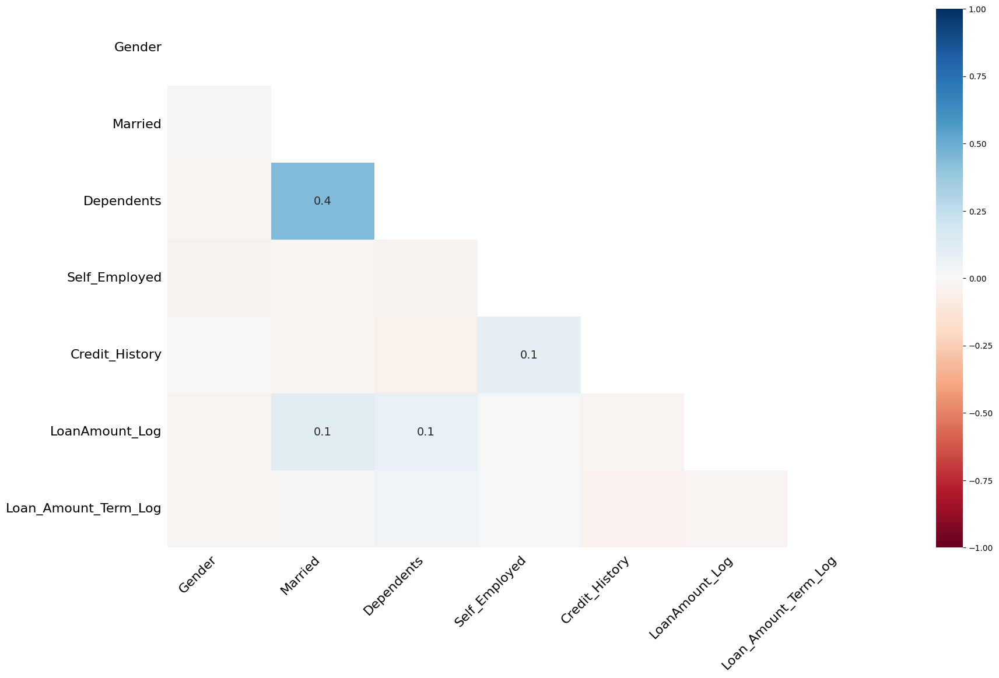

In [52]:
msno.heatmap(df);

### Handling The Missing Values

#### Remove
```python
# (ROW), at least one missing value in the observation
df.dropna()

# (ROW) just remove the observation which the all variables are missed 
df.dropna(how='all')

# col
df.dropna(axis=1)
df.dropna(axis=1, how="all")

# (Row) Remove the rows which %50 and more of the features is missed
th_miss_feat_size = len(df.columns) // 2
df.dropna(thresh=th_miss_feat_size)
```

In [53]:
# Just remove the row which all the features are missed.
df.dropna(how='all', inplace=True)

#### Imputate with stat (Implemented)




In [54]:
df.isnull().sum()

Gender                  13
Married                  3
Dependents              15
Education                0
Self_Employed           32
Credit_History          50
Property_Area            0
Loan_Status              0
ApplicantIncome_Log      0
LoanAmount_Log          22
Loan_Amount_Term_Log    14
Total_Income_Log         0
dtype: int64

In [55]:
# Continous imputation with the mean of the corresponding feature
df[num_cols] = df[num_cols].apply(lambda col: col.fillna(col.mean()), axis = 0)

In [56]:
# Categorical imputation with the most frequently label
df[cat_cols] = df[cat_cols].apply(lambda col: col.fillna(col.mode()[0]), axis = 0)

In [57]:
df.isnull().sum()

Gender                  0
Married                 0
Dependents              0
Education               0
Self_Employed           0
Credit_History          0
Property_Area           0
Loan_Status             0
ApplicantIncome_Log     0
LoanAmount_Log          0
Loan_Amount_Term_Log    0
Total_Income_Log        0
dtype: int64

#### Imputate through prediction (not implemented)

```python
from fancyimpute import KNN

knn_imputed= KNN(k=5).fit_transform(df)
df_imputed = pd.DataFrame(knn_imputed, columns = df.columns)
```

```python
# Imputating with KNN via ycimpute 
from ycimpute.imputer import knnimput

knn_imputed = knnimput.KNN(k=4).complete(np.array(df))
df_imputed = pd.DataFrame(knn_imputed, columns= df.columns)
```

```python
# Imputating with Random Forest via ycimpute 
from ycimpute.imputer import iterforest

rf_imputed = iterforest.IterImput().complete(np.array(df))
df_imputed = pd.DataFrame(rf_imputed, columns = df.columns)
```

```python
# Imputing with EM via ycimpute 
from ycimpute.imputer import EM

em_imputed = EM().complete(np.array(df))
df_imputed = pd.DataFrame(em_imputed, columns=var_names)
```

## Outlier Analysis

### Visual Approach

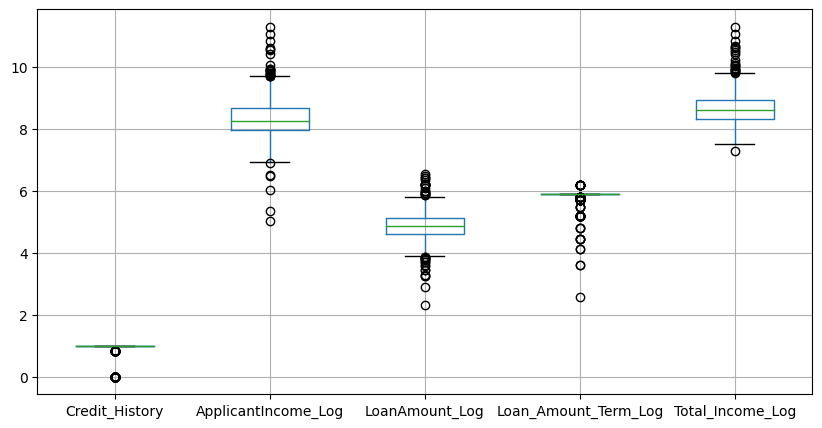

In [58]:
plt.figure(figsize=(10,5));
df.boxplot();

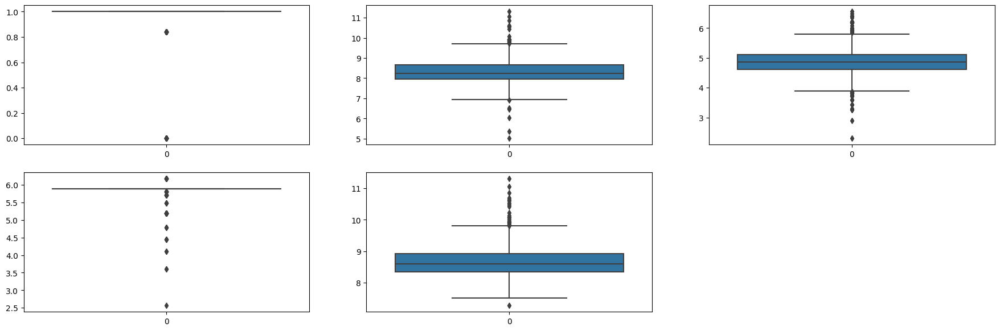

In [59]:
cum_col_sie = len(num_cols)

plt.figure(figsize=(22, 7))
for i, col in enumerate(num_cols):
  plt.subplot(2, cum_col_sie//2+1, i+1)
  sns.boxplot(df[col]);

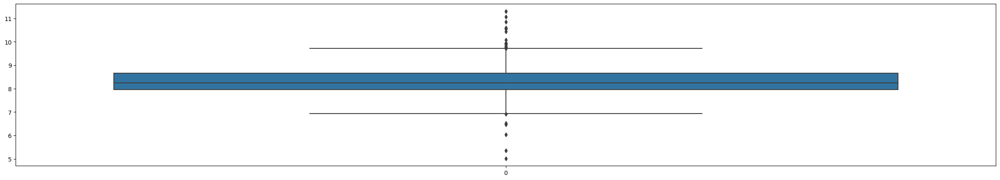

In [60]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["ApplicantIncome_Log"]);

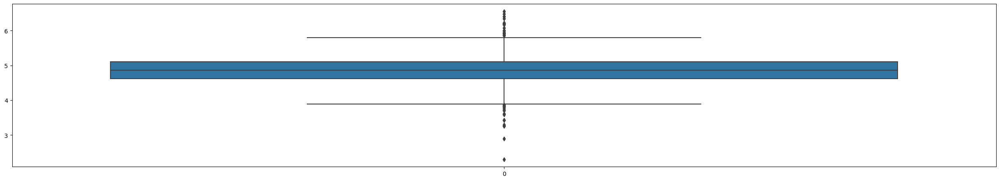

In [61]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["LoanAmount_Log"]);

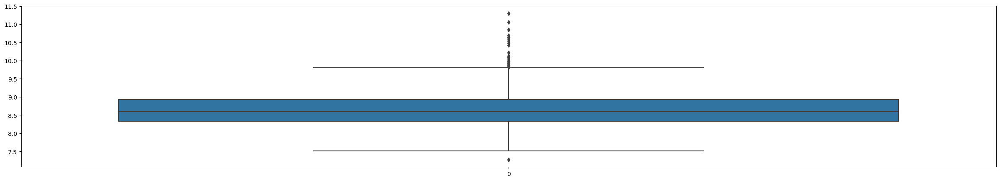

In [62]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["Total_Income_Log"]);

(614,
 array([5.88887796, 4.79579055, 5.48479693, 5.80462587, 5.19849703,
        4.11087386, 5.70711026, 6.17586727, 3.61091791, 4.44265126,
        2.56494936]))

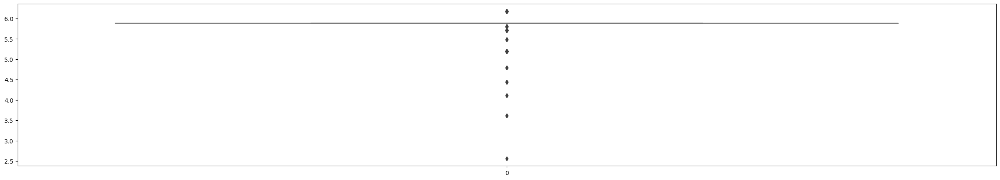

In [63]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["Loan_Amount_Term_Log"]);
df["Loan_Amount_Term_Log"].count(), df["Loan_Amount_Term_Log"].unique() 

(614, array([1.        , 0.        , 0.84219858]))

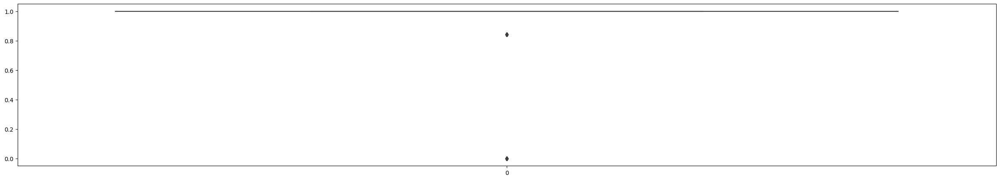

In [64]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["Credit_History"]);
df["Credit_History"].count(), df["Credit_History"].unique() 

### IQR approach

- Note that
  - If you want to change a certain pertantage of the data for handling outliers.
    - You can adjust the ratio param forn  IQR_calculator funct to adjust inliar range.
  - If the ratio increate, 
    - outlier count will be reduce. Just the most outliers will be captured. 

#### Calculating IQR
- Calculates
  - __IQR__ pandas series for all the given variables
  - __l_th__ lower_threashold pandas series for all the given variables
  - __h_th__ higher_threashold pandas series for all the given variables

In [65]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

In [66]:
IQR, l_th, h_th = IQR_calculator(df, ratio=1.5)

In [67]:
from pprint import pprint
for i in [IQR, l_th, h_th]:
  print("-"*20)
  pprint(i)
  print("-"*20, end="\n"*2)

--------------------
Credit_History          0.000000
ApplicantIncome_Log     0.699898
LoanAmount_Log          0.492894
Loan_Amount_Term_Log    0.000000
Total_Income_Log        0.590731
dtype: float64
--------------------

--------------------
Credit_History          1.000000
ApplicantIncome_Log     6.915177
LoanAmount_Log          3.878243
Loan_Amount_Term_Log    5.888878
Total_Income_Log        7.448856
dtype: float64
--------------------

--------------------
Credit_History          1.000000
ApplicantIncome_Log     9.714769
LoanAmount_Log          5.849818
Loan_Amount_Term_Log    5.888878
Total_Income_Log        9.811778
dtype: float64
--------------------



### Finding out The outlier values
- Finds __is_outlier__ and __is_outlier_val__ dataframes which include boolean value for ever individual value.

In [68]:
def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

In [69]:
def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

In [70]:
# Getting the outlier indexes
is_outlier, num_cols = find_outlier(df, l_th, h_th)
is_outlier.head()

,Credit_History,ApplicantIncome_Log,LoanAmount_Log,Loan_Amount_Term_Log,Total_Income_Log
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False


In [71]:
is_outlier.sum()

Credit_History          139
ApplicantIncome_Log      27
LoanAmount_Log           39
Loan_Amount_Term_Log    102
Total_Income_Log         22
dtype: int64

In [72]:
is_outlier.sum() / df[is_outlier.columns].count()

Credit_History          0.226384
ApplicantIncome_Log     0.043974
LoanAmount_Log          0.063518
Loan_Amount_Term_Log    0.166124
Total_Income_Log        0.035831
dtype: float64

In [73]:
# determinating the variables which will be handle for avoiding outlier 
outlier_cols = ["ApplicantIncome_Log", "LoanAmount_Log", "Total_Income_Log"]
is_outlier_val = is_outlier[outlier_cols]

In [74]:
is_outlier_val

,ApplicantIncome_Log,LoanAmount_Log,Total_Income_Log
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
609,False,False,False
610,False,True,False
611,False,False,False
612,False,False,False


In [75]:
df["ApplicantIncome_Log"][is_outlier_val["ApplicantIncome_Log"]].head()

77      6.908755
126    10.077609
130     9.911803
155    10.596635
171    10.854450
Name: ApplicantIncome_Log, dtype: float64

In [76]:
ApplicantIncome_Log_outlier_indexs = df["ApplicantIncome_Log"][is_outlier_val["ApplicantIncome_Log"]].index
ApplicantIncome_Log_outlier_indexs[:5]

Int64Index([77, 126, 130, 155, 171], dtype='int64')

In [77]:
df["ApplicantIncome_Log"].isnull().sum()

0

In [78]:
# Getting Outlier values
ApplicantIncome_Log_outlier_values = df[is_outlier_val].iloc[list(ApplicantIncome_Log_outlier_indexs)]#[is_outlier_val]
ApplicantIncome_Log_outlier_values[outlier_cols].head(10)

,ApplicantIncome_Log,LoanAmount_Log,Total_Income_Log
77,6.908755,NaN,NaN
126,10.077609,5.916202,10.077609
130,9.911803,6.478510,9.911803
155,10.596635,6.398595,10.596635
171,10.854450,6.552508,10.854450
183,10.429606,NaN,10.429606
185,10.575105,NaN,10.689624
188,6.514713,NaN,NaN
216,5.017280,NaN,NaN
284,9.936342,NaN,9.936342


### Handling outlier
- There are no outliers in the dataset, so no handling process is implemented

#### Util Functions

In [79]:
def mean_assignment(data:pd.Series, is_outlier:pd.Series, value:float):
  "It assigns given value to the outlier values"
  data[is_outlier] = value
  return data

# usage # df["c1"] = mean_assignment(df["c1"], is_outlier["c1"], df["c1"].mean()):

In [80]:
def boundary_casting(data:pd.Series, l_th:float, h_th:float):
  "It assigns border values to the outlier values"
  
  data[ data < l_th ] = l_th
  data[ h_th < data ] = h_th

  return data

#### Before

In [81]:
ApplicantIncome_Log_outlier_values[outlier_cols].head(10)

,ApplicantIncome_Log,LoanAmount_Log,Total_Income_Log
77,6.908755,NaN,NaN
126,10.077609,5.916202,10.077609
130,9.911803,6.478510,9.911803
155,10.596635,6.398595,10.596635
171,10.854450,6.552508,10.854450
183,10.429606,NaN,10.429606
185,10.575105,NaN,10.689624
188,6.514713,NaN,NaN
216,5.017280,NaN,NaN
284,9.936342,NaN,9.936342


#### Handling

In [82]:
for col in outlier_cols:
  print(f"{col:<20}: lower_th: {l_th[col]:<3.3},   higher_th: {h_th[col]:<10.3}")

ApplicantIncome_Log : lower_th: 6.92,   higher_th: 9.71      
LoanAmount_Log      : lower_th: 3.88,   higher_th: 5.85      
Total_Income_Log    : lower_th: 7.45,   higher_th: 9.81      


In [83]:
for col in outlier_cols:
  df[col] = boundary_casting(df[col], l_th[col], h_th[col])

#### After

In [84]:
# Getting Outlier values
ApplicantIncome_Log_outlier_values_after = df[is_outlier_val].iloc[list(ApplicantIncome_Log_outlier_indexs)]#[is_outlier_val]
ApplicantIncome_Log_outlier_values_after[outlier_cols].head(10)

,ApplicantIncome_Log,LoanAmount_Log,Total_Income_Log
77,6.915177,NaN,NaN
126,9.714769,5.849818,9.811778
130,9.714769,5.849818,9.811778
155,9.714769,5.849818,9.811778
171,9.714769,5.849818,9.811778
183,9.714769,NaN,9.811778
185,9.714769,NaN,9.811778
188,6.915177,NaN,NaN
216,6.915177,NaN,NaN
284,9.714769,NaN,9.811778


# (D) Exploratory Data Analysis

## Dataset 

### Spesifications

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Gender                614 non-null    category
 1   Married               614 non-null    category
 2   Dependents            614 non-null    category
 3   Education             614 non-null    category
 4   Self_Employed         614 non-null    category
 5   Credit_History        614 non-null    float64 
 6   Property_Area         614 non-null    category
 7   Loan_Status           614 non-null    category
 8   ApplicantIncome_Log   614 non-null    float64 
 9   LoanAmount_Log        614 non-null    float64 
 10  Loan_Amount_Term_Log  614 non-null    float64 
 11  Total_Income_Log      614 non-null    float64 
dtypes: category(7), float64(5)
memory usage: 29.2 KB


In [86]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Credit_History,614.0,0.842199,0.349681,0.000000,1.000000,1.000000,1.000000,1.000000
ApplicantIncome_Log,614.0,8.334970,0.569781,6.915177,7.965024,8.246303,8.664922,9.714769
LoanAmount_Log,614.0,4.866970,0.432537,3.878243,4.617584,4.866325,5.110477,5.849818
Loan_Amount_Term_Log,614.0,5.804626,0.309530,2.564949,5.888878,5.888878,5.888878,6.175867
Total_Income_Log,614.0,8.653020,0.492974,7.448856,8.334952,8.597390,8.925682,9.811778


In [87]:
pd.unique(df.select_dtypes(include=["object","category"]).values.ravel('k'))

array(['Male', 'Female', 'No', 'Yes', '0', '1', '2', '3+', 'Graduate',
       'Not Graduate', 'Urban', 'Rural', 'Semiurban', 'Y', 'N'],
      dtype=object)

### Temporary encoding

#### Via pandas

In [88]:
encoded_df = df.copy()

In [89]:
for col in encoded_df.select_dtypes(include= ["object","category"]):
  encoded_df[col] = encoded_df[col].astype("category").cat.codes

In [90]:
for col in encoded_df.select_dtypes(include=[bool]):
  encoded_df[col] = encoded_df[col].astype(int)

In [91]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                614 non-null    int8   
 1   Married               614 non-null    int8   
 2   Dependents            614 non-null    int8   
 3   Education             614 non-null    int8   
 4   Self_Employed         614 non-null    int8   
 5   Credit_History        614 non-null    float64
 6   Property_Area         614 non-null    int8   
 7   Loan_Status           614 non-null    int8   
 8   ApplicantIncome_Log   614 non-null    float64
 9   LoanAmount_Log        614 non-null    float64
 10  Loan_Amount_Term_Log  614 non-null    float64
 11  Total_Income_Log      614 non-null    float64
dtypes: float64(5), int8(7)
memory usage: 28.3 KB


#### Via Sklean Label Encode

In [100]:
encoded_df_sk = df.copy()

In [101]:
from sklearn.preprocessing import LabelEncoder

tmp_sk_encoder = {}
for col in encoded_df_sk.select_dtypes(include= ["object","category",bool]):
  tmp_encoder = LabelEncoder()
  encoded_df_sk[col] = tmp_encoder.fit_transform(encoded_df_sk[col])
  tmp_sk_encoder[col] = tmp_encoder

In [102]:
encoded_df_sk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                614 non-null    int64  
 1   Married               614 non-null    int64  
 2   Dependents            614 non-null    int64  
 3   Education             614 non-null    int64  
 4   Self_Employed         614 non-null    int64  
 5   Credit_History        614 non-null    float64
 6   Property_Area         614 non-null    int64  
 7   Loan_Status           614 non-null    int64  
 8   ApplicantIncome_Log   614 non-null    float64
 9   LoanAmount_Log        614 non-null    float64
 10  Loan_Amount_Term_Log  614 non-null    float64
 11  Total_Income_Log      614 non-null    float64
dtypes: float64(5), int64(7)
memory usage: 57.7 KB


## Dataset Spesifications

In [103]:
encoded_df_sk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                614 non-null    int64  
 1   Married               614 non-null    int64  
 2   Dependents            614 non-null    int64  
 3   Education             614 non-null    int64  
 4   Self_Employed         614 non-null    int64  
 5   Credit_History        614 non-null    float64
 6   Property_Area         614 non-null    int64  
 7   Loan_Status           614 non-null    int64  
 8   ApplicantIncome_Log   614 non-null    float64
 9   LoanAmount_Log        614 non-null    float64
 10  Loan_Amount_Term_Log  614 non-null    float64
 11  Total_Income_Log      614 non-null    float64
dtypes: float64(5), int64(7)
memory usage: 57.7 KB


In [104]:
encoded_df_sk.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,614.0,0.817590,0.386497,0.000000,1.000000,1.000000,1.000000,1.000000
Married,614.0,0.653094,0.476373,0.000000,0.000000,1.000000,1.000000,1.000000
Dependents,614.0,0.744300,1.009623,0.000000,0.000000,0.000000,1.000000,3.000000
Education,614.0,0.218241,0.413389,0.000000,0.000000,0.000000,0.000000,1.000000
Self_Employed,614.0,0.133550,0.340446,0.000000,0.000000,0.000000,0.000000,1.000000
Credit_History,614.0,0.842199,0.349681,0.000000,1.000000,1.000000,1.000000,1.000000
Property_Area,614.0,1.037459,0.787482,0.000000,0.000000,1.000000,2.000000,2.000000
Loan_Status,614.0,0.687296,0.463973,0.000000,0.000000,1.000000,1.000000,1.000000
ApplicantIncome_Log,614.0,8.334970,0.569781,6.915177,7.965024,8.246303,8.664922,9.714769
LoanAmount_Log,614.0,4.866970,0.432537,3.878243,4.617584,4.866325,5.110477,5.849818


In [105]:
pd.unique(encoded_df_sk.select_dtypes(include=["category"]).values.ravel('k'))

array([], dtype=float64)

## Univariate Analysis

In [144]:
num_cols = df.select_dtypes(include=("int64","float64"), exclude=("bool") ).columns
cat_cols = df.select_dtypes(exclude=("int64","float64")).columns

In [107]:
num_cols

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'Loan_Status', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log'],
      dtype='object')

In [108]:
len(encoded_df_sk.columns), df.columns

(12,
 Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
        'Credit_History', 'Property_Area', 'Loan_Status', 'ApplicantIncome_Log',
        'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log'],
       dtype='object'))

In [109]:
encoded_df_sk[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Empty DataFrame

In [110]:
encoded_df_sk[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                614 non-null    int64  
 1   Married               614 non-null    int64  
 2   Dependents            614 non-null    int64  
 3   Education             614 non-null    int64  
 4   Self_Employed         614 non-null    int64  
 5   Credit_History        614 non-null    float64
 6   Property_Area         614 non-null    int64  
 7   Loan_Status           614 non-null    int64  
 8   ApplicantIncome_Log   614 non-null    float64
 9   LoanAmount_Log        614 non-null    float64
 10  Loan_Amount_Term_Log  614 non-null    float64
 11  Total_Income_Log      614 non-null    float64
dtypes: float64(5), int64(7)
memory usage: 57.7 KB


### Target Variable

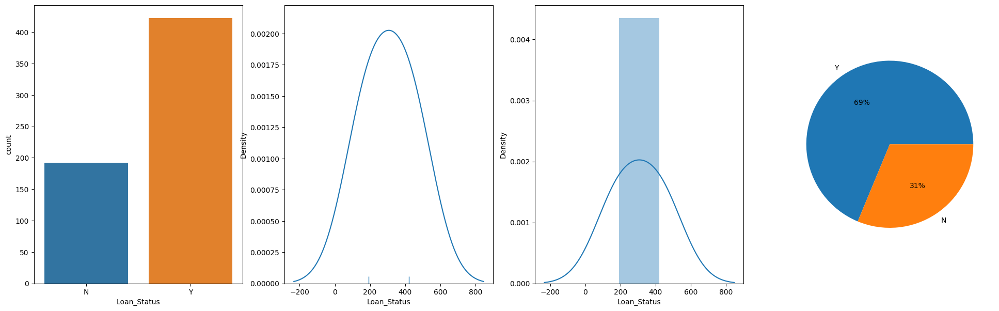

In [112]:
target_var = "Loan_Status"

plt.figure(figsize=(24,7))

plt.subplot(1,4,1)
sns.countplot(data=df, x=target_var);

plt.subplot(1,4,2)
sns.distplot(df[target_var].value_counts(), rug=True, hist=False);

plt.subplot(1,4,3)
sns.distplot(df[target_var].value_counts(), rug=False, hist=True);

plt.subplot(1,4,4)
plt.pie(df[target_var].value_counts(), labels=df[target_var].unique(), autopct="%.0f%%");

### Feature Variables [Numerical]

#### setting the plotting params

In [114]:
# Defining the params
target_var = "Loan_Status"
#num_cols = df.select_dtypes(exclude='category').columns
num_col_size = len(num_cols)
cols, rows = (3, num_col_size//3 + 1) if num_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

#### [histplot] Distributions

In [115]:
num_cols

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'Loan_Status', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log'],
      dtype='object')

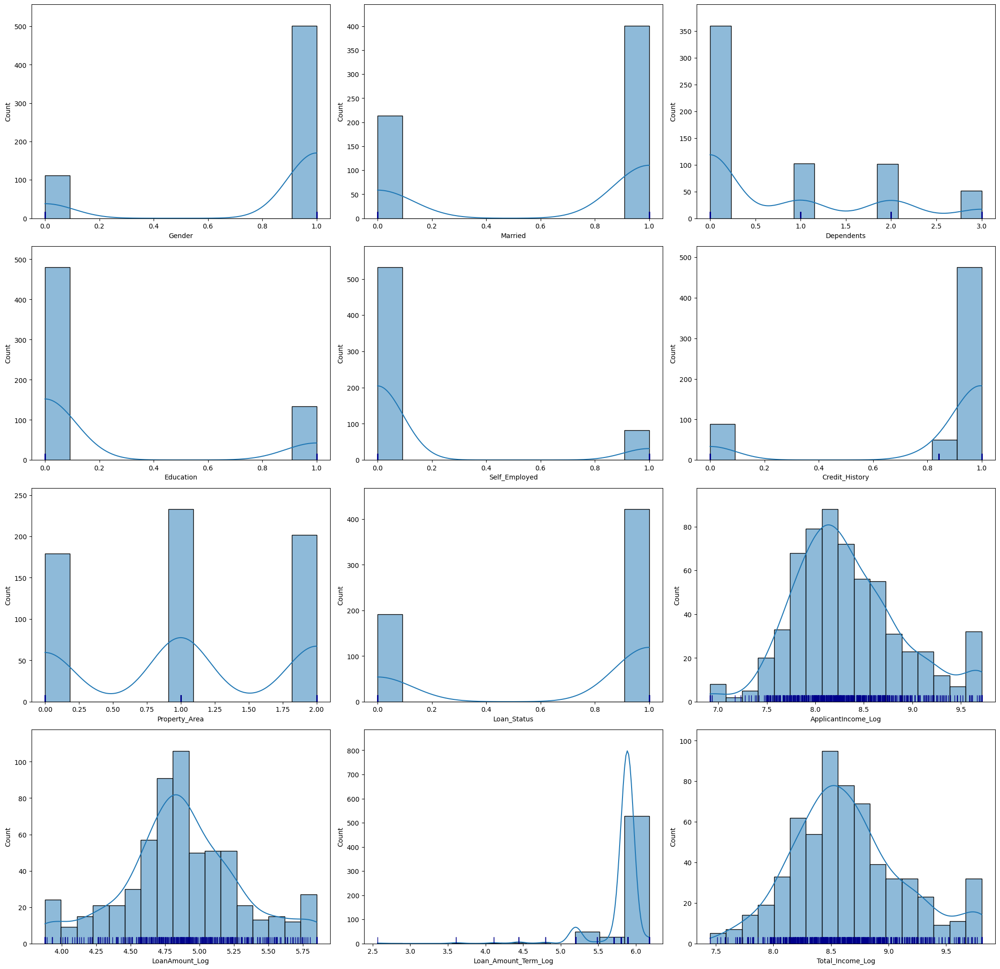

In [116]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=encoded_df_sk[col], data=df, kde=True, ax=ax)
    sns.rugplot(x=encoded_df_sk[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

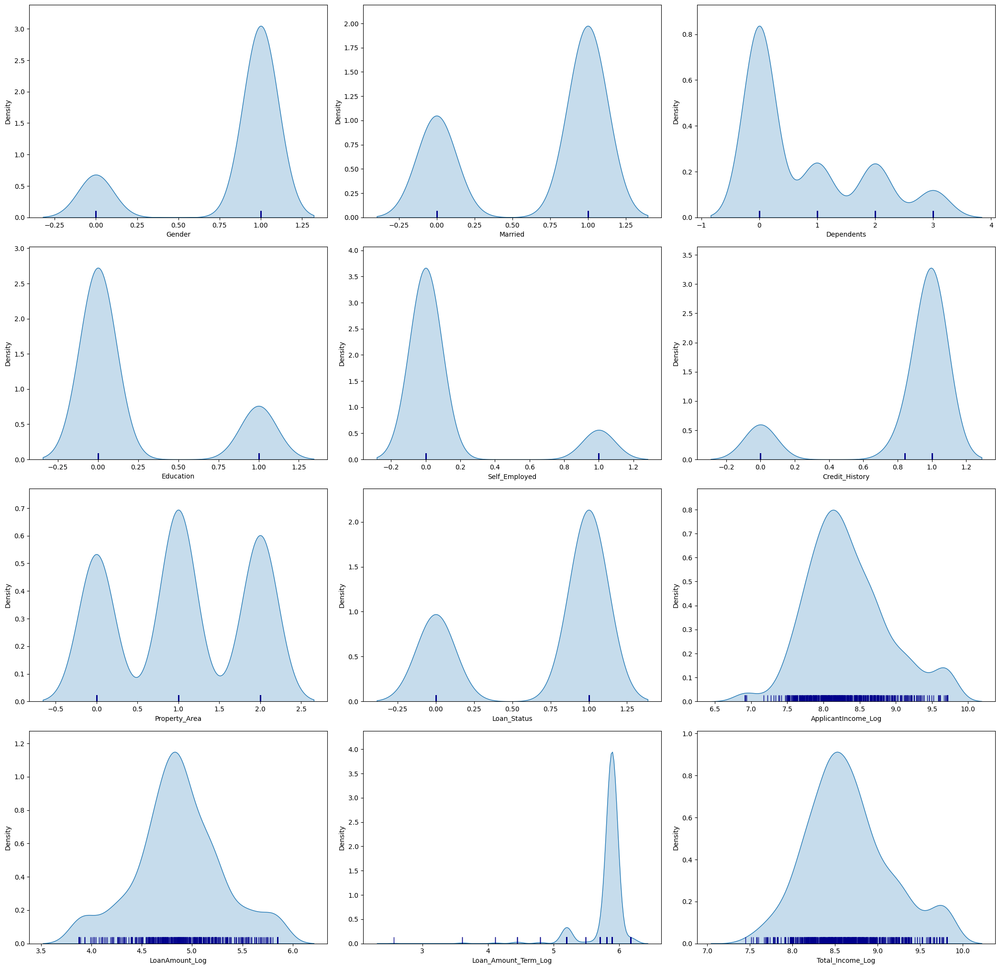

In [125]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.kdeplot(x=encoded_df_sk[col], data=encoded_df_sk ,shade=True, ax=ax)
    sns.rugplot(x=encoded_df_sk[col], data=encoded_df_sk, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

#### [boxplot] Distributions with quartiles (Outlier)

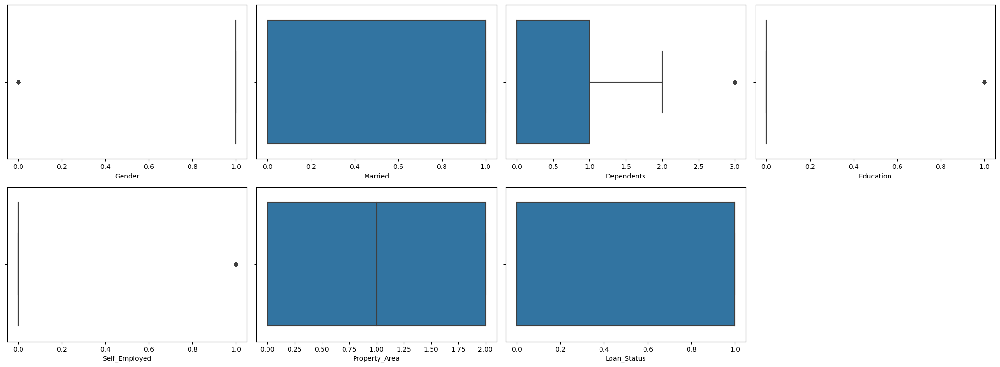

In [165]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.boxplot(x=encoded_df_sk[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [violinplot] Distributions with quartiles and density

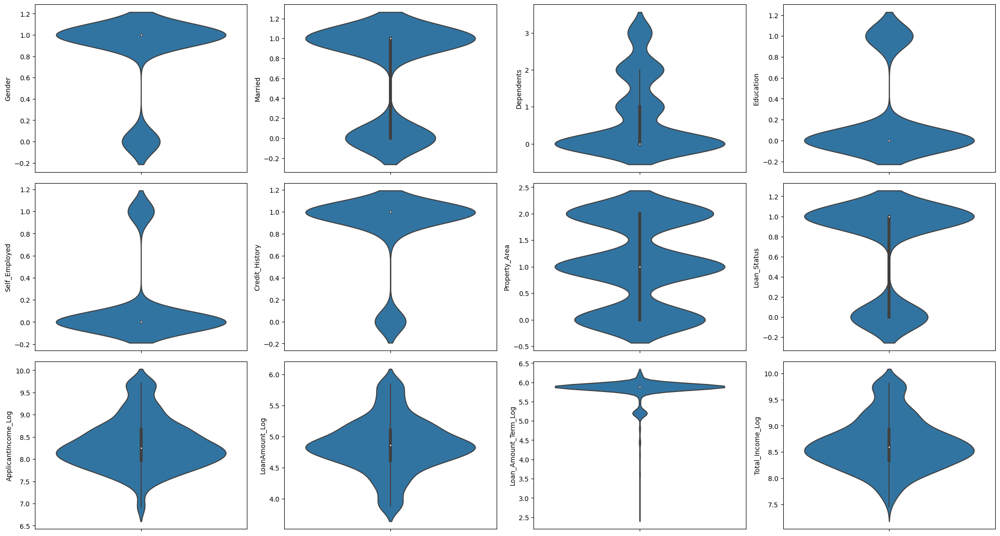

In [215]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(y=encoded_df_sk[col], show_medians=True, ax=ax)
    
fig.tight_layout()  
plt.show()

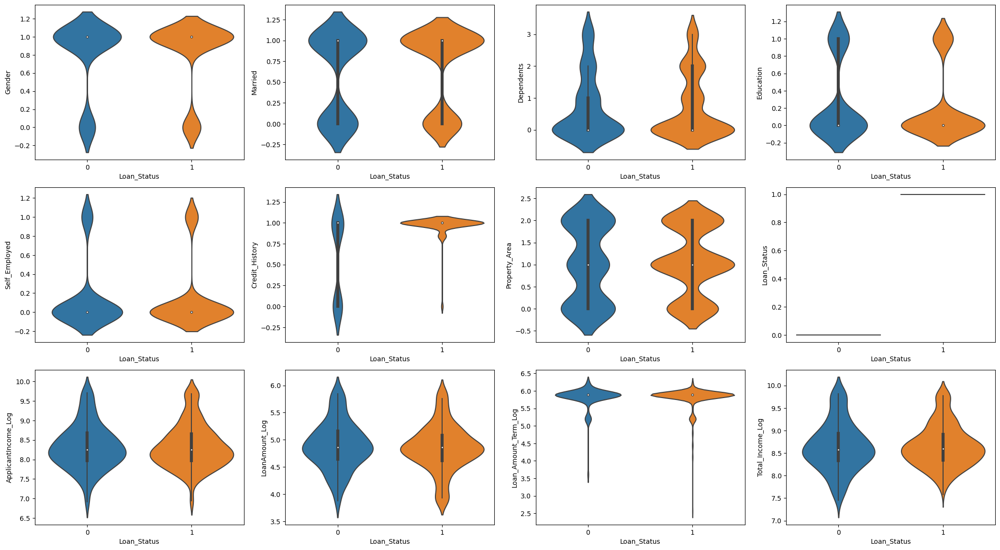

In [214]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(y=encoded_df_sk[col], x=encoded_df_sk[target_var], show_medians=True, ax=ax)


    
fig.tight_layout()  
plt.show()

#### [stripplot] spread of the data with stripplot

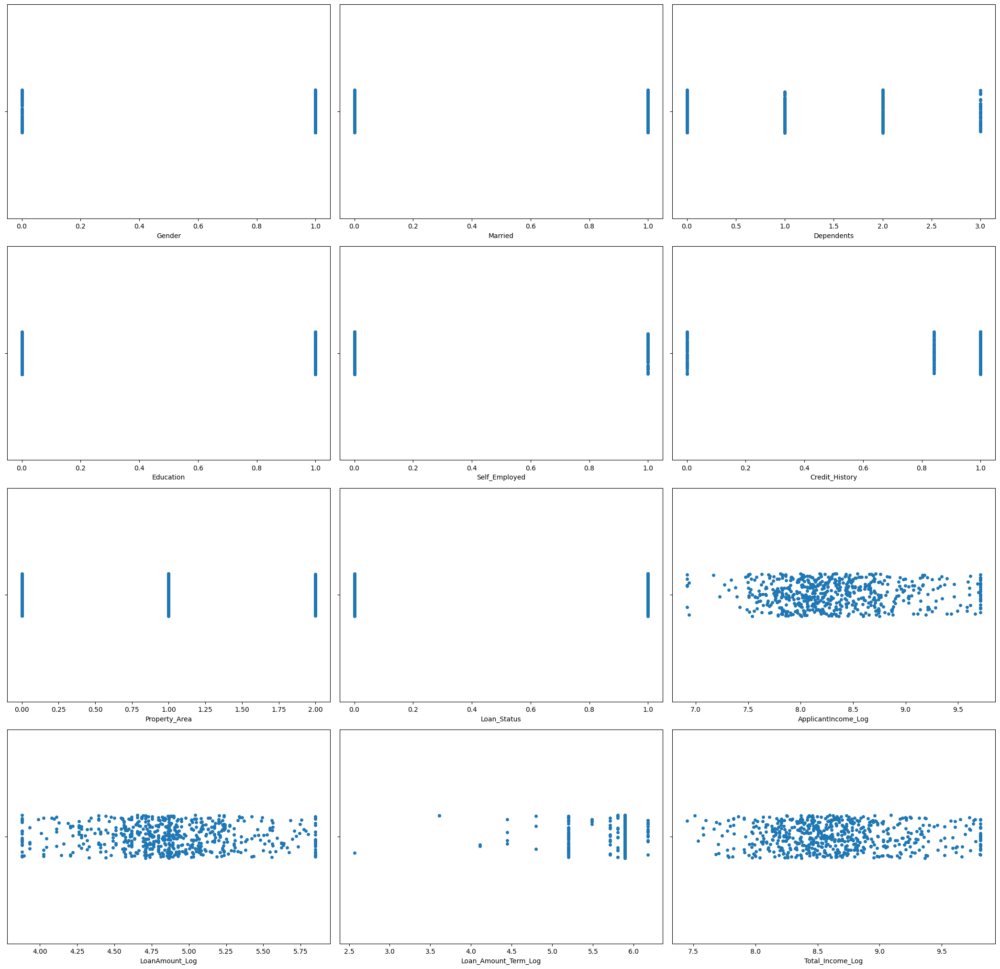

In [126]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # stripplot
    sns.stripplot(x=encoded_df_sk[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [swarmplot] spread of the data with stripplot (avoids overlap)
```python
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # swarmplot
    sns.swarmplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()
```

#### [scatterplot] Spread of data 

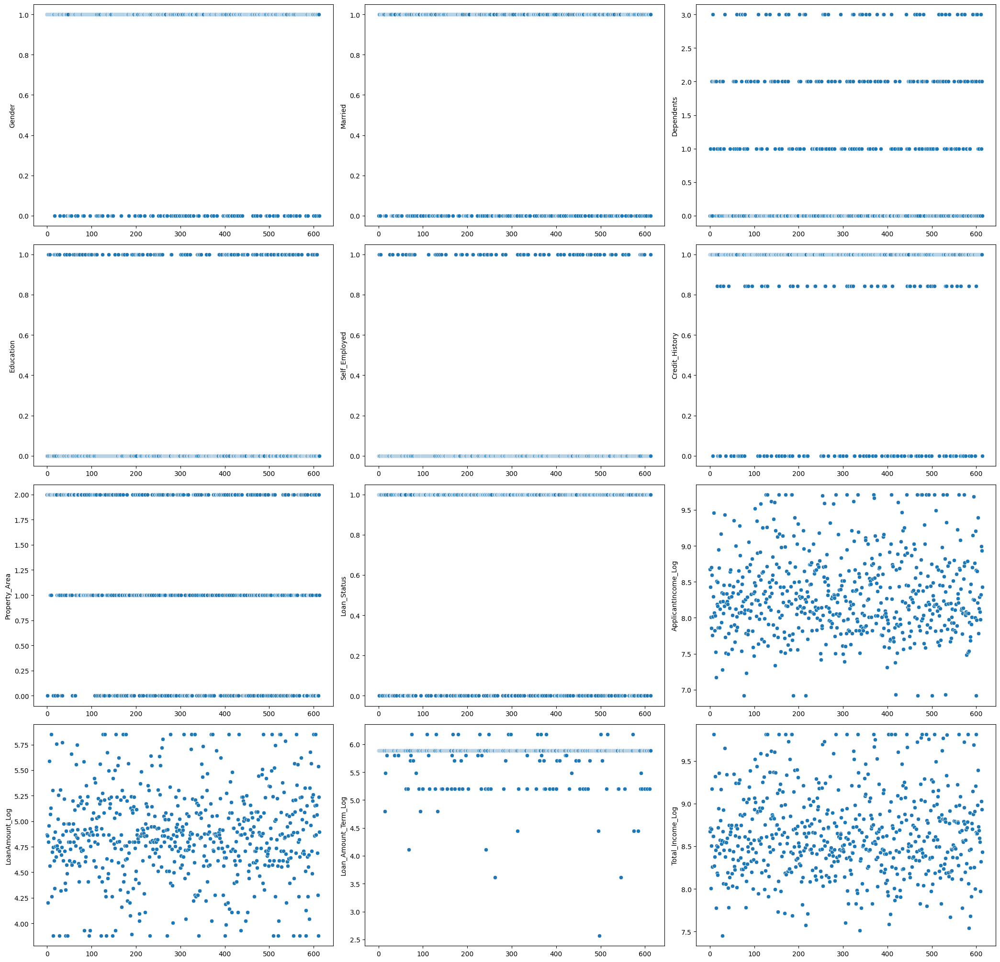

In [127]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # scatterplot
    sns.scatterplot(x = encoded_df_sk[col].index, y= encoded_df_sk[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [lineplot] Trend

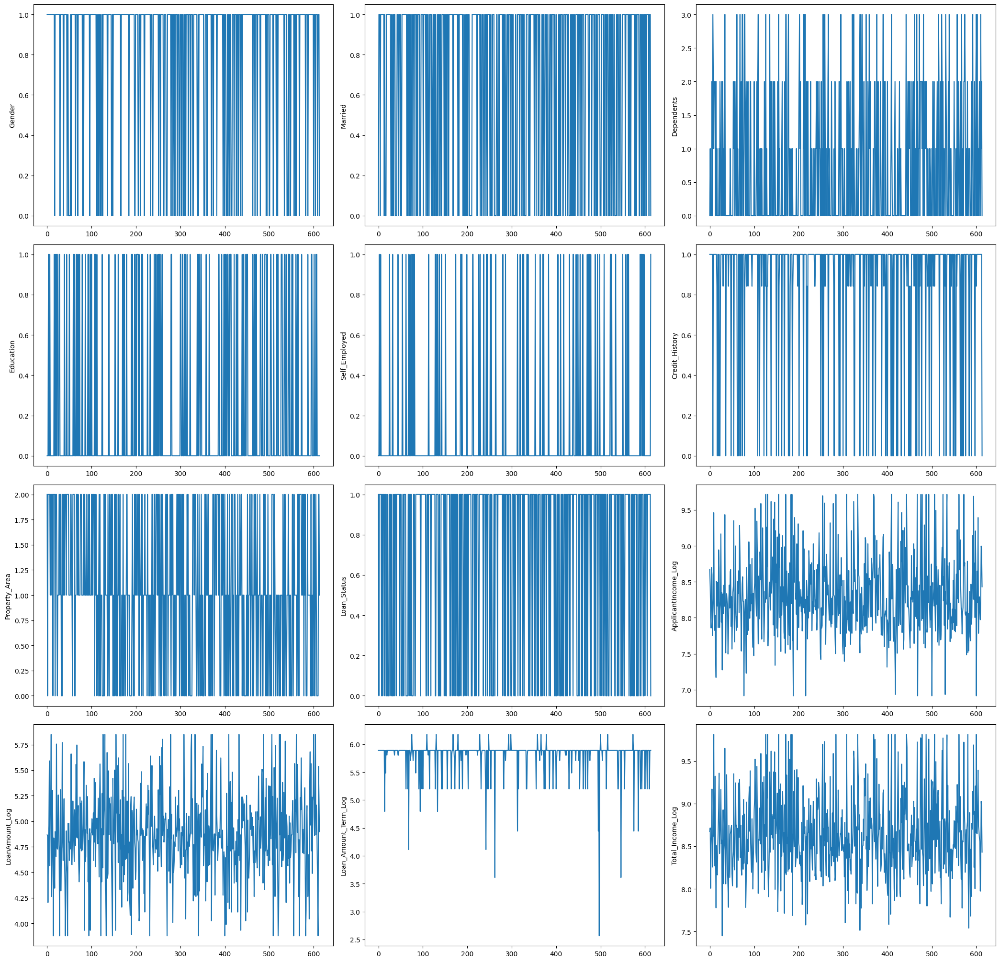

In [128]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.lineplot(x=encoded_df_sk[col].index, y=encoded_df_sk[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

### Feature Variables [Categorical]

#### setting the plotting params

In [146]:
# Defining the params
target_var = "Loan_Status"
#num_cols = df.select_dtypes(exclude='category').columns
cat_col_size = len(cat_cols)
cols, rows = (3, cat_col_size//3 + 1) if cat_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

In [147]:
cat_cols

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Property_Area', 'Loan_Status'],
      dtype='object')

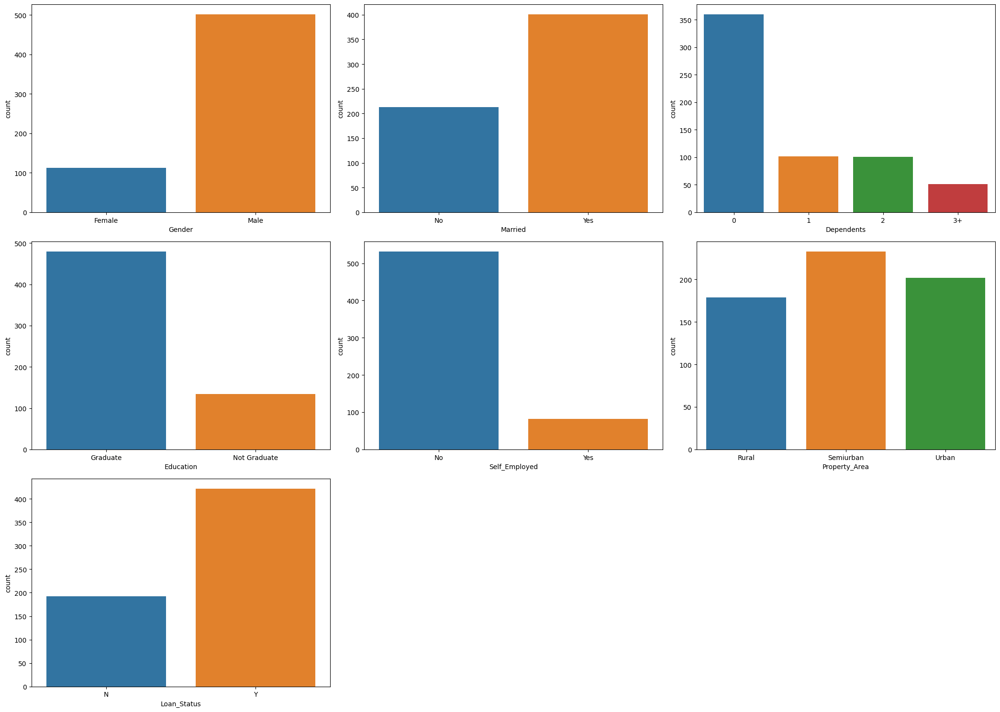

In [150]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

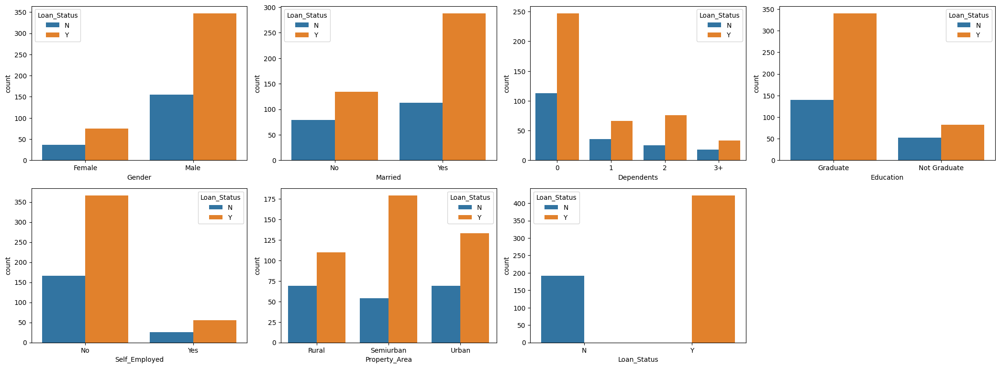

In [216]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], hue=df[target_var],ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

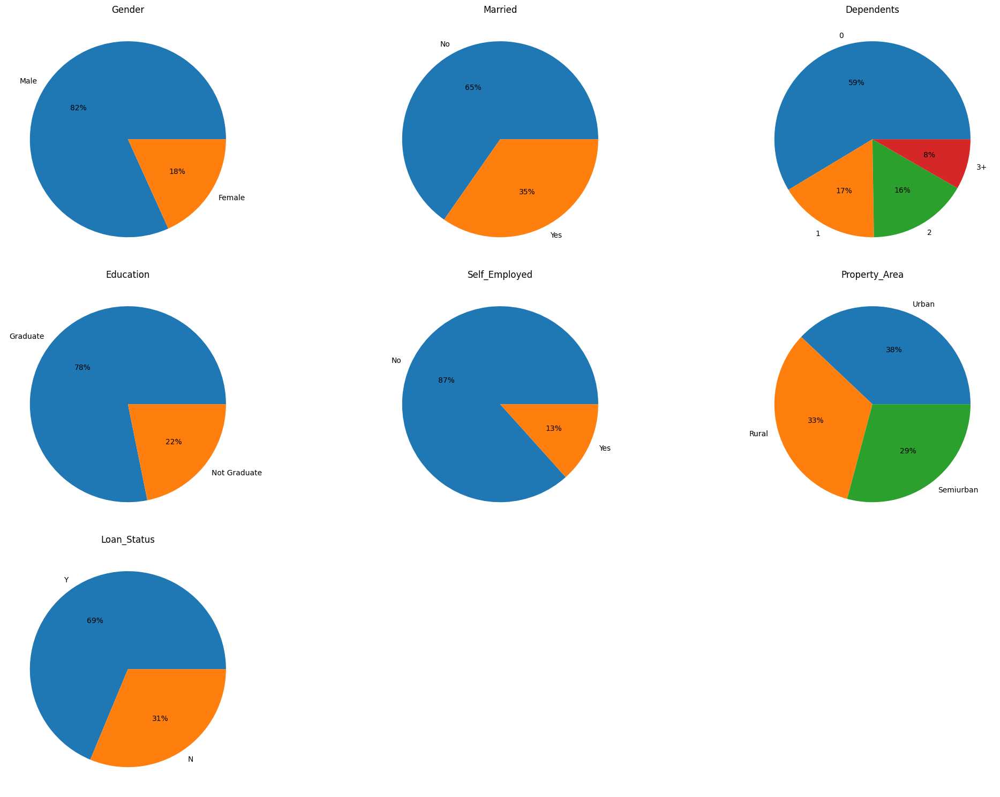

In [233]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    

    # creating new axis for plotting
    ax=fig.add_subplot( 3, 3, i+1)#( rows, cols, i+1)
    
  
    # boxplot
    plt.pie(df[col].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    plt.title(col)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

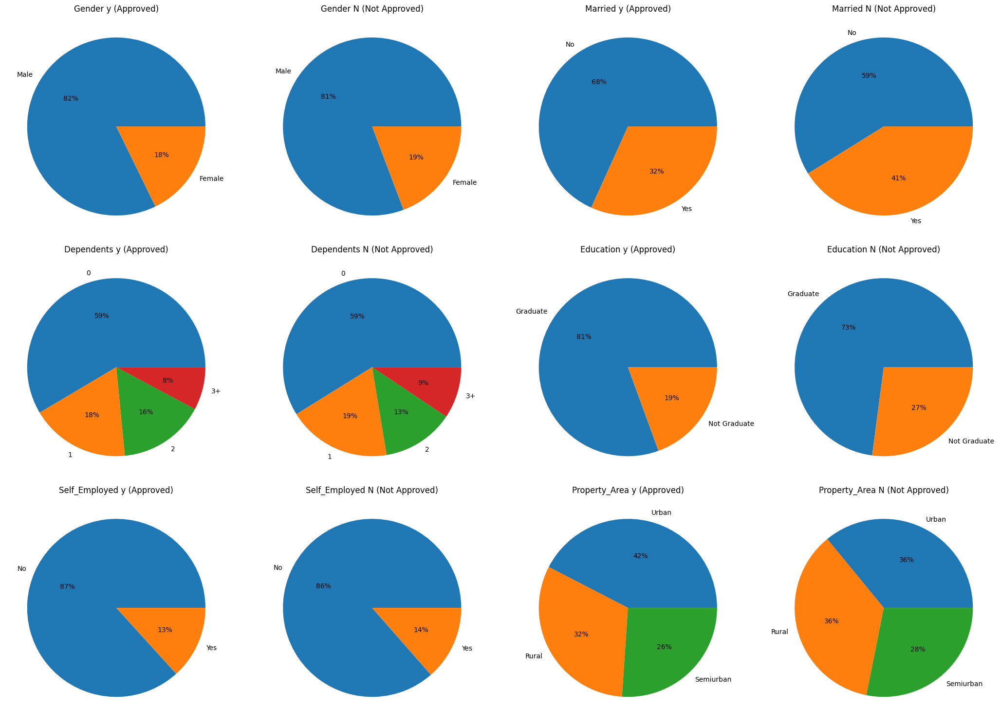

In [232]:
from itertools import count
fig = plt.figure(figsize=figsize)
for i, col in zip(count(step=2),cat_cols):

    if col == target_var: continue

    # creating new axis for plotting
    ax=fig.add_subplot(3, 4, i+1)#( rows, cols, i+1)
    
  
    # boxplot
    plt.pie(df[col][df[target_var]=="Y"].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    plt.title(col + " y (Approved)")
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)

    ax=fig.add_subplot(3, 4, i+2)#( rows, cols, i+2)
    plt.pie(df[col][df[target_var]=="N"].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    plt.title(col + " N (Not Approved)")
    
fig.tight_layout()  
plt.show()

## Bivariate & Multivariate Analysis

In [152]:
num_cols

Index(['Credit_History', 'ApplicantIncome_Log', 'LoanAmount_Log',
       'Loan_Amount_Term_Log', 'Total_Income_Log'],
      dtype='object')

In [153]:
cat_cols

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Property_Area', 'Loan_Status'],
      dtype='object')

In [ ]:
#sns.JointGrid(df["ApplicantIncome_Log"], df["LoanAmount_Log"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [ ]:
#sns.JointGrid(df["ApplicantIncome_Log"], df["Total_Income_Log"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [ ]:
#sns.JointGrid(df["LoanAmount_Log"], df["Total_Income_Log"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

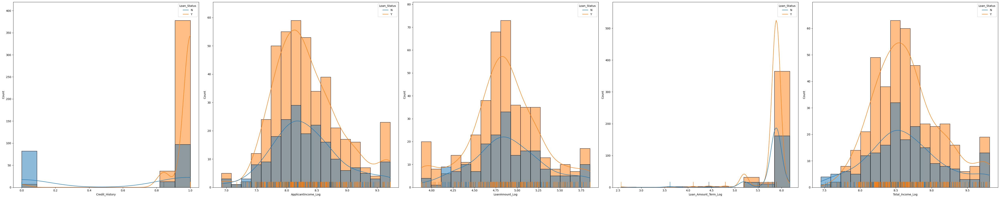

In [ ]:
fig = plt.figure( figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, hue=df[target_var], kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, hue=df[target_var], height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

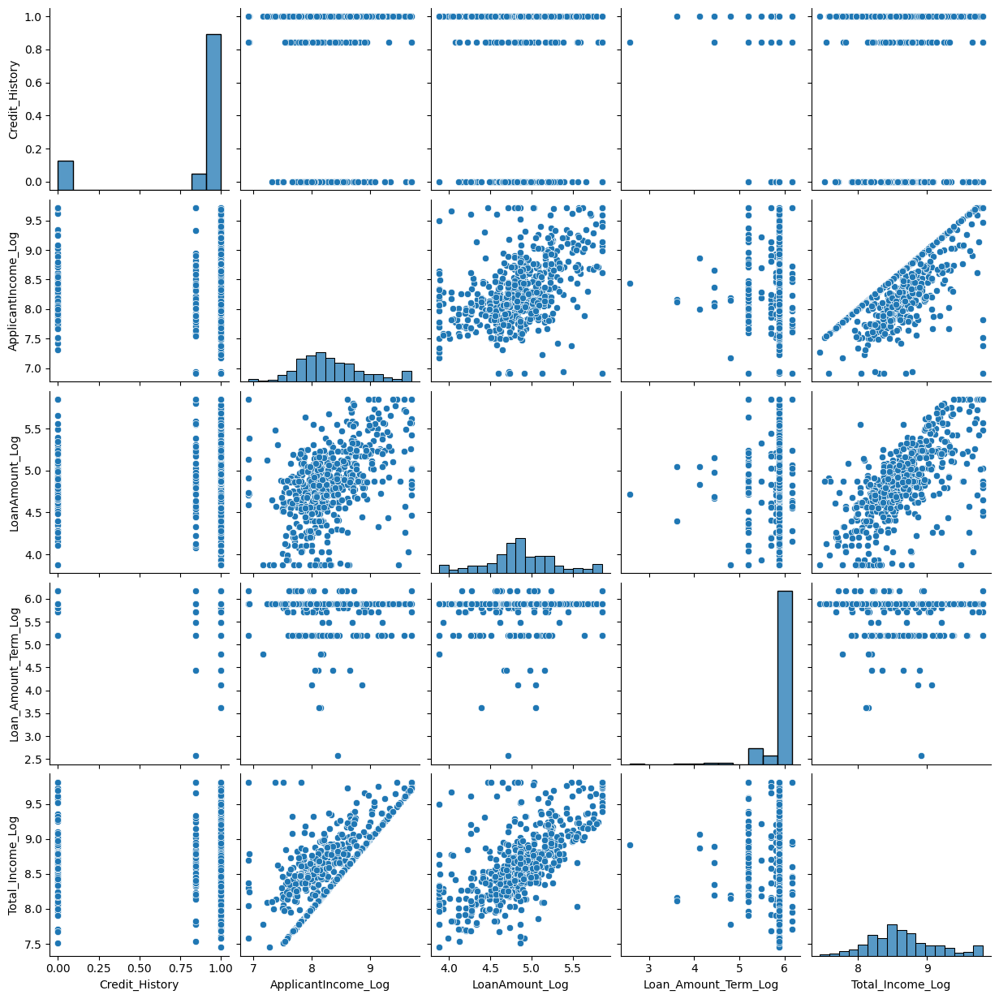

In [ ]:
sns.pairplot(df);

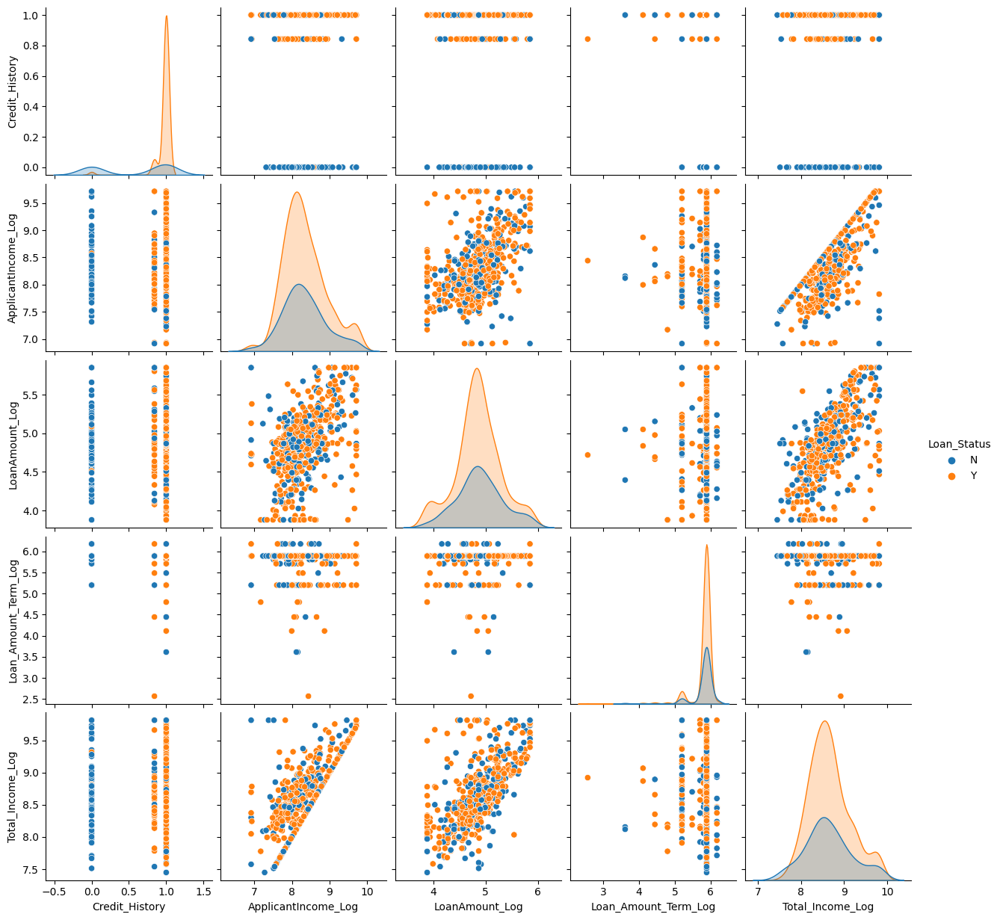

In [ ]:
sns.pairplot(df, hue=target_var);

<Figure size 2000x2000 with 0 Axes>

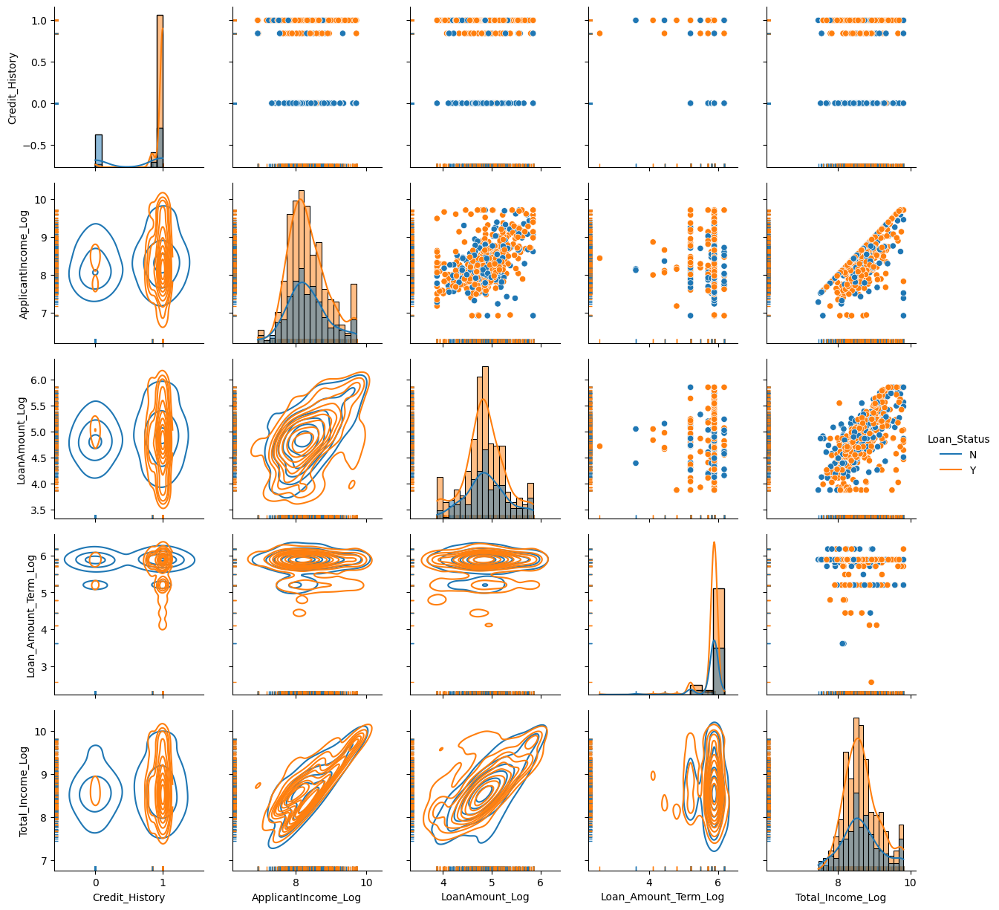

In [ ]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df, diag_sharey=False, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)
g.map(sns.rugplot);
g.add_legend();

<Figure size 2000x2000 with 0 Axes>

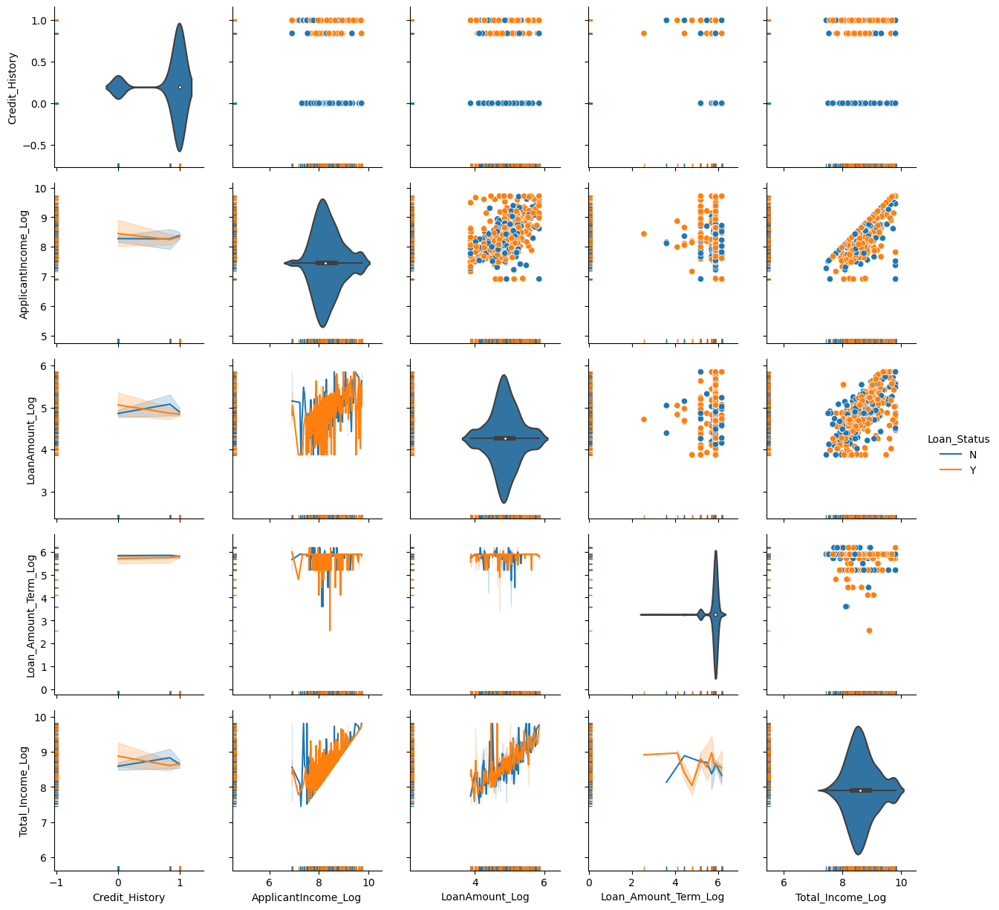

In [ ]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

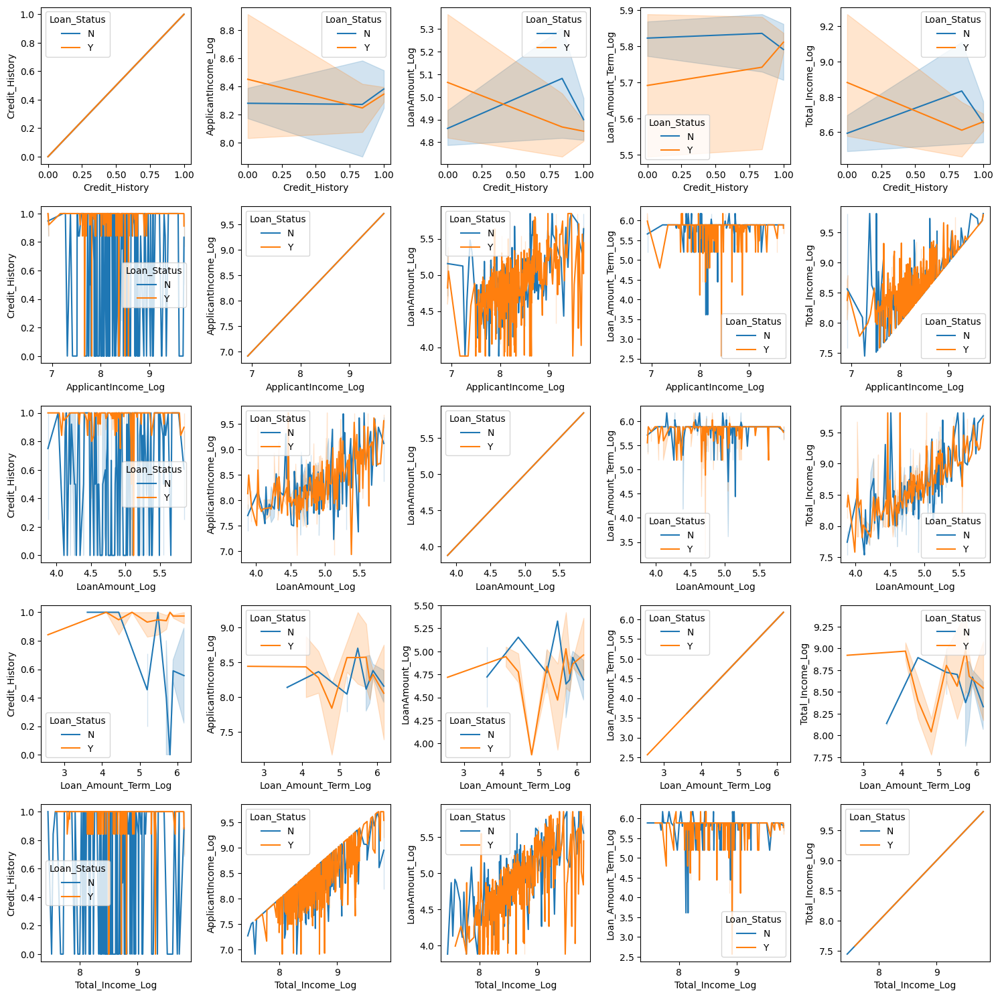

In [ ]:
row_size, col_size = len(num_cols), len(num_cols)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= df, x=row, y=col, hue=target_var, ax=ax)
        
fig.tight_layout()  
plt.show()

In [158]:
rows, cols = len(encoded_df_sk.columns)//4+1, 4 

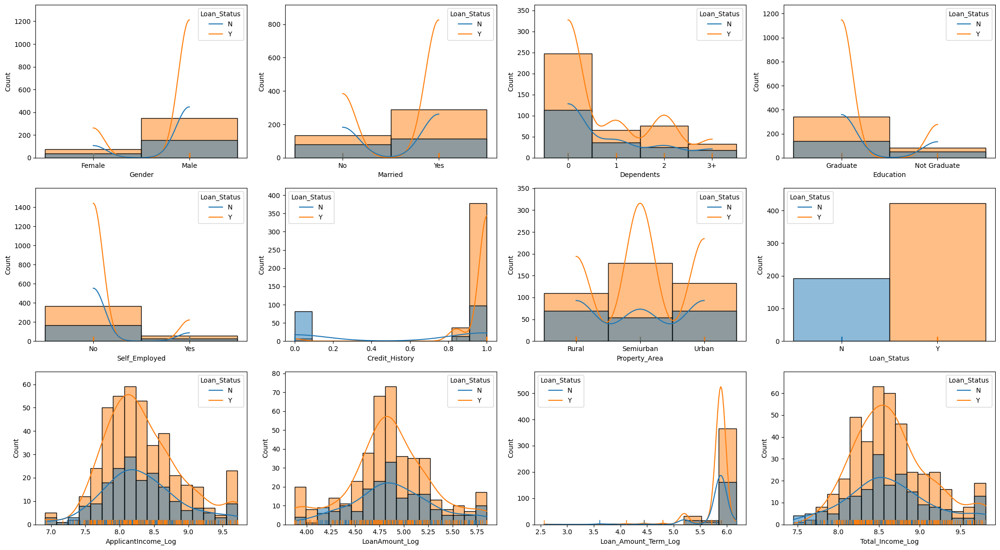

In [159]:
fig = plt.figure( figsize=figsize)
for i, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=encoded_df_sk, hue=df[target_var], kde=True, ax=ax)
    sns.rugplot(x=df[col], data=encoded_df_sk, hue=df[target_var], height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

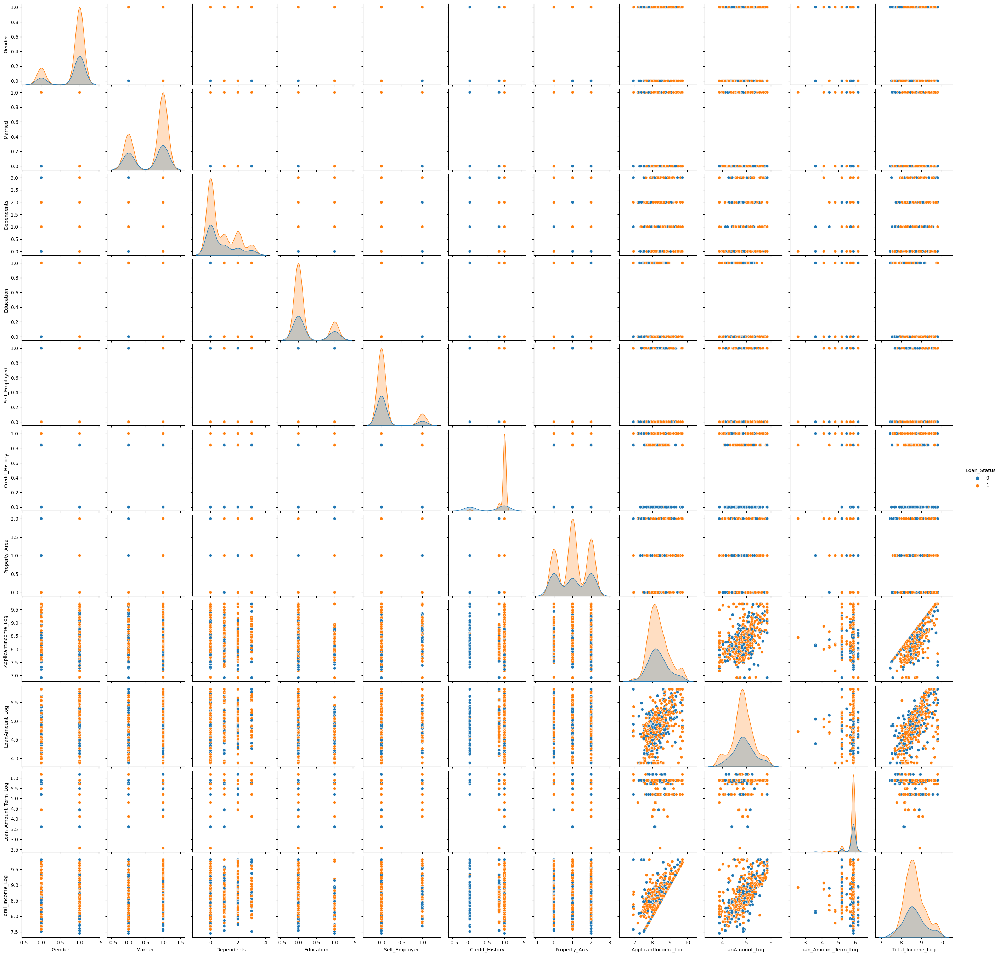

In [161]:
sns.pairplot(encoded_df_sk, hue=target_var);

In [162]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(encoded_df_sk, diag_sharey=False, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)
g.map(sns.rugplot);
g.add_legend();

Output hidden; open in https://colab.research.google.com to view.

<Figure size 2000x2000 with 0 Axes>

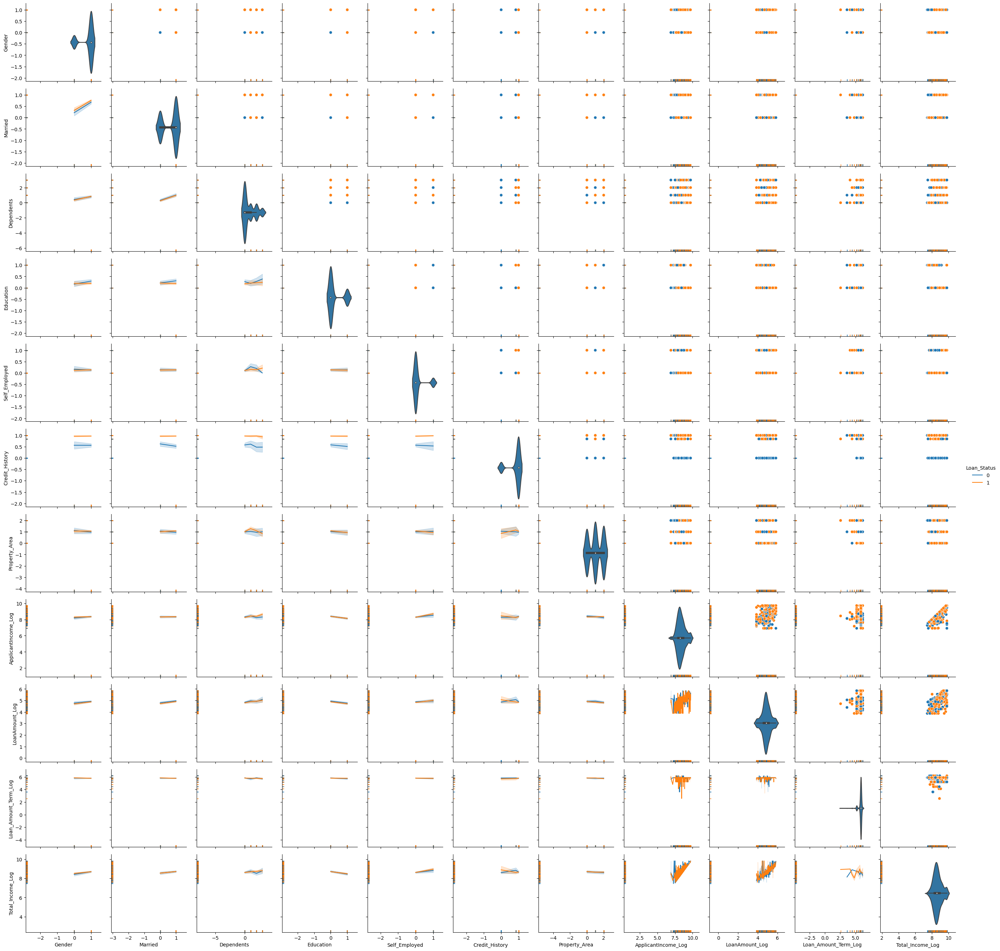

In [163]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(encoded_df_sk, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

In [164]:
row_size, col_size = len(encoded_df_sk.columns), len(encoded_df_sk.columns)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
    for j, col in enumerate(encoded_df_sk.columns):#enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= encoded_df_sk, x=row, y=col, hue=target_var, ax=ax)
        
fig.tight_layout()  
plt.show()

Output hidden; open in https://colab.research.google.com to view.

## Relations

### Quick Variable Relation

In [166]:
def rel_filter(df:pd.DataFrame, th:float)->pd.DataFrame:
  # Calculating the relations
  corr = df.corr()

  # filtering the relations
  filtered_corr = corr[corr > th]  if th > 0.0 else corr[corr < th]

  return filtered_corr

def rel_plotter(corr:pd.DataFrame, title:str="Correlations", figsize:tuple=None, cmap="Blues", annot=True):
  
  # plotting configurations
  if figsize != None: plt.figure(figsize=figsize)

  # plotting the relattions
  sns.heatmap(corr, cmap="Blues", annot=True)
  plt.title(title);

def get_relations(corr:pd.DataFrame, th:float)->list:

  # decleration of params
  columns = corr.columns
  is_exceed = (lambda rel: rel > th)  if th > 0 else (lambda rel: rel < th)  

  # getting the column names which exceedes the threashold
  filtered_relations = list()
  for row in columns:
    for col in columns:
        
        # Pass the correaltion with itself
        if col==row: continue

        # Collect variables which exvide threashold correlation 
        cur_corr = corr.loc[row, col]
        if  is_exceed(cur_corr):

          # Check whether the record have already added
          is_already_added = [ all([ e in record for e in [row, col] ])  for record in filtered_relations ]
          
          # Add if it have not already added
          if not any(is_already_added): filtered_relations.append([row, col, np.round(cur_corr, 2)]) 
  
  return filtered_relations

In [167]:
get_relations(df.corr(), 0.85), get_relations(encoded_df_sk.corr(), 0.85)

([], [])

In [168]:
get_relations(df.corr(), 0.5), get_relations(encoded_df_sk.corr(), 0.5)

([['ApplicantIncome_Log', 'LoanAmount_Log', 0.51],
  ['ApplicantIncome_Log', 'Total_Income_Log', 0.75],
  ['LoanAmount_Log', 'Total_Income_Log', 0.68]],
 [['Credit_History', 'Loan_Status', 0.54],
  ['ApplicantIncome_Log', 'LoanAmount_Log', 0.51],
  ['ApplicantIncome_Log', 'Total_Income_Log', 0.75],
  ['LoanAmount_Log', 'Total_Income_Log', 0.68]])

In [169]:
get_relations(df.corr(), (-0.7)), get_relations(encoded_df_sk.corr(),  (-0.7))

([], [])

In [170]:
get_relations(df.corr(), -0.5), get_relations(encoded_df_sk.corr(), -0.5)

([], [])

In [177]:
def get_var_corrs(df:pd.DataFrame, var:str, top_n:int=5, th:float=None):
  # checking the params whether valid
  if var not in df.columns: raise f"'{var}' column does not exist in the dataframe"

  # Calculating the correlation
  var_corrs = df.corr()[var].drop(var)

  # Filtering & sorting 
  if th != None:

    # Filtering
    filter = (lambda df: df[df > th] )  if th > 0 else (lambda df: df[df < th]) 
    var_corrs = filter(var_corrs)
    
    # Sorting
    is_asc = False if th > 0 else True
    var_corrs = var_corrs.sort_values(ascending=is_asc)
    var_corrs = var_corrs[:top_n]

  return var_corrs

In [178]:
target_var in df.columns 

True

In [182]:
p_corrs = get_var_corrs(encoded_df_sk, target_var, top_n=5, th=0.25)
p_corrs_names = p_corrs.index
p_corrs

Loan_Status       1.000000
Credit_History    0.540483
Name: Loan_Status, dtype: float64

In [183]:
n_corrs = get_var_corrs(encoded_df_sk, target_var, top_n=5, th=-0.25)
n_corrs_names = n_corrs.index
n_corrs

Series([], Name: Loan_Status, dtype: float64)

### Correlation

In [184]:
df.corr()

,Credit_History,ApplicantIncome_Log,LoanAmount_Log,Loan_Amount_Term_Log,Total_Income_Log
Credit_History,1.000000,0.036158,-0.014498,-0.005883,0.029507
ApplicantIncome_Log,0.036158,1.000000,0.506657,-0.008219,0.753706
LoanAmount_Log,-0.014498,0.506657,1.000000,0.071612,0.675081
Loan_Amount_Term_Log,-0.005883,-0.008219,0.071612,1.000000,-0.018828
Total_Income_Log,0.029507,0.753706,0.675081,-0.018828,1.000000


In [185]:
encoded_df_sk.corr()

,Gender,Married,Dependents,Education,Self_Employed,Credit_History,Property_Area,Loan_Status,ApplicantIncome_Log,LoanAmount_Log,Loan_Amount_Term_Log,Total_Income_Log
Gender,1.000000,0.364569,0.172914,0.045364,-0.000525,0.012819,-0.025752,0.017987,0.071028,0.147294,-0.053866,0.176745
Married,0.364569,1.000000,0.334216,0.012304,0.004489,0.005852,0.004257,0.091478,0.016074,0.188693,-0.068681,0.160131
Dependents,0.172914,0.334216,1.000000,0.055752,0.056798,-0.037392,-0.000244,0.010118,0.116733,0.163216,-0.076330,0.099383
Education,0.045364,0.012304,0.055752,1.000000,-0.010383,-0.077936,-0.065243,-0.085884,-0.189770,-0.157839,-0.066452,-0.207298
Self_Employed,-0.000525,0.004489,0.056798,-0.010383,1.000000,-0.002260,-0.030860,-0.003700,0.210945,0.110839,-0.026185,0.196453
Credit_History,0.012819,0.005852,-0.037392,-0.077936,-0.002260,1.000000,-0.001880,0.540483,0.036158,-0.014498,-0.005883,0.029507
Property_Area,-0.025752,0.004257,-0.000244,-0.065243,-0.030860,-0.001880,1.000000,0.032112,-0.041431,-0.093529,-0.084359,-0.057937
Loan_Status,0.017987,0.091478,0.010118,-0.085884,-0.003700,0.540483,0.032112,1.000000,0.005983,-0.044721,-0.006622,0.016818
ApplicantIncome_Log,0.071028,0.016074,0.116733,-0.189770,0.210945,0.036158,-0.041431,0.005983,1.000000,0.506657,-0.008219,0.753706
LoanAmount_Log,0.147294,0.188693,0.163216,-0.157839,0.110839,-0.014498,-0.093529,-0.044721,0.506657,1.000000,0.071612,0.675081


<Axes: >

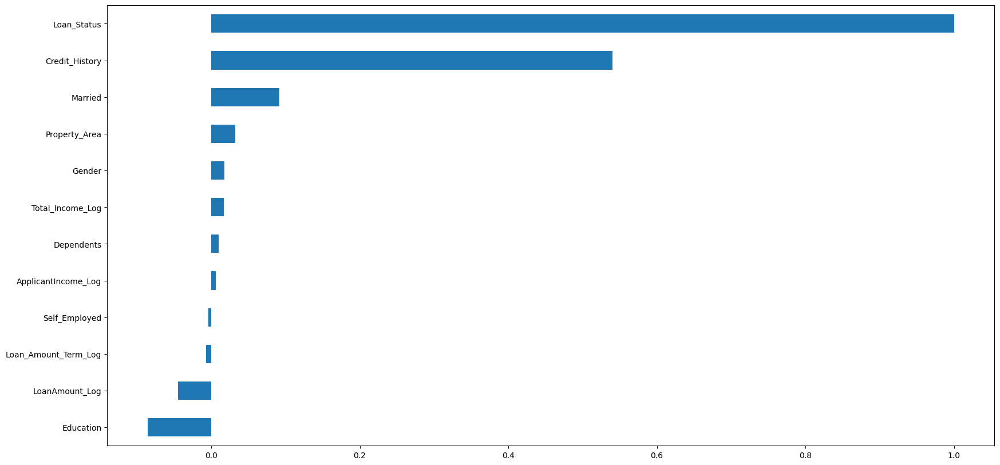

In [186]:
# Target Variable's correlation
encoded_df_sk.corr()[target_var].sort_values().plot(kind="barh", figsize=(20,10))

<Axes: >

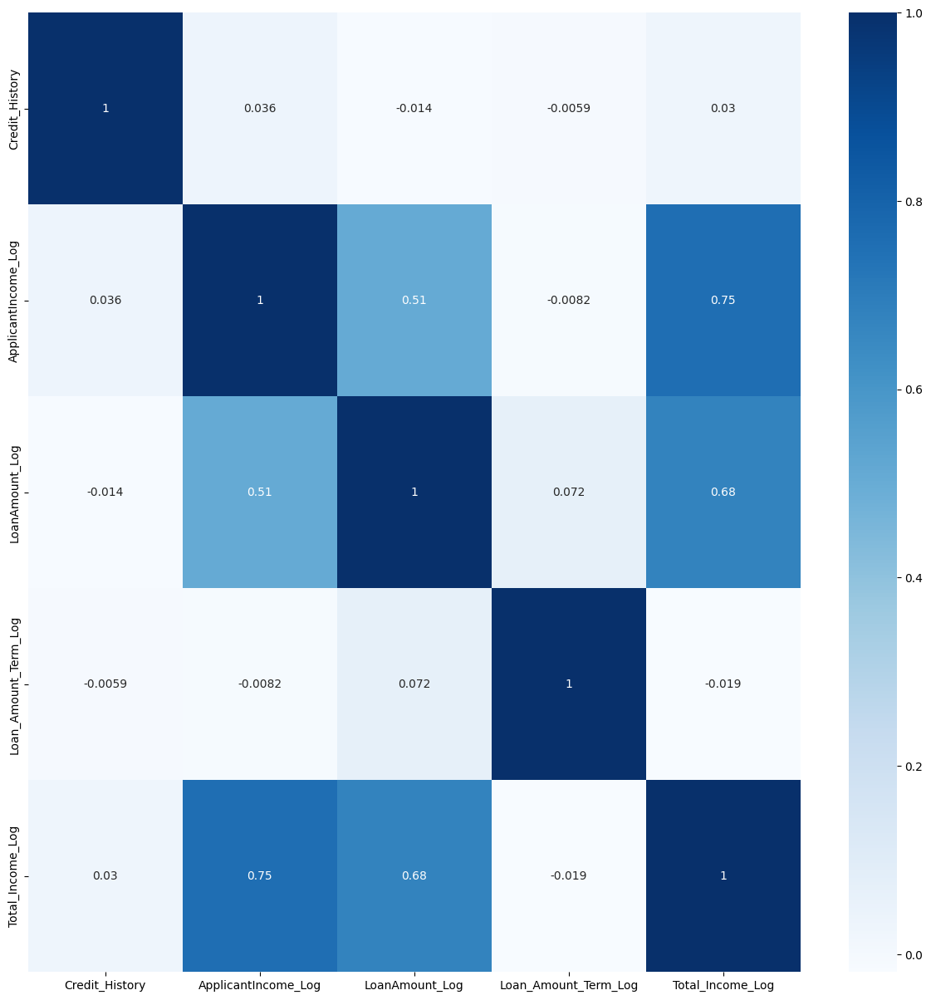

In [187]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), annot=True, cmap='Blues')

<Axes: >

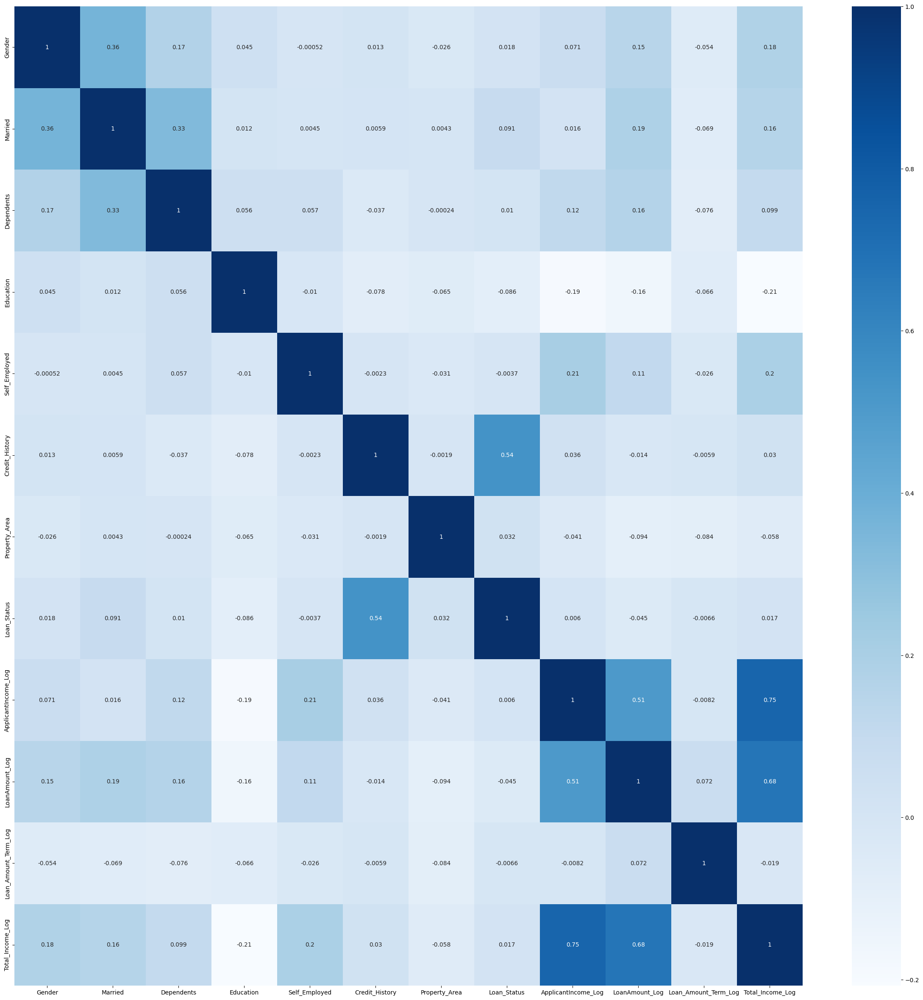

In [188]:
plt.figure(figsize=(30,30))
sns.heatmap(encoded_df.corr(), annot=True, cmap='Blues')

<Axes: >

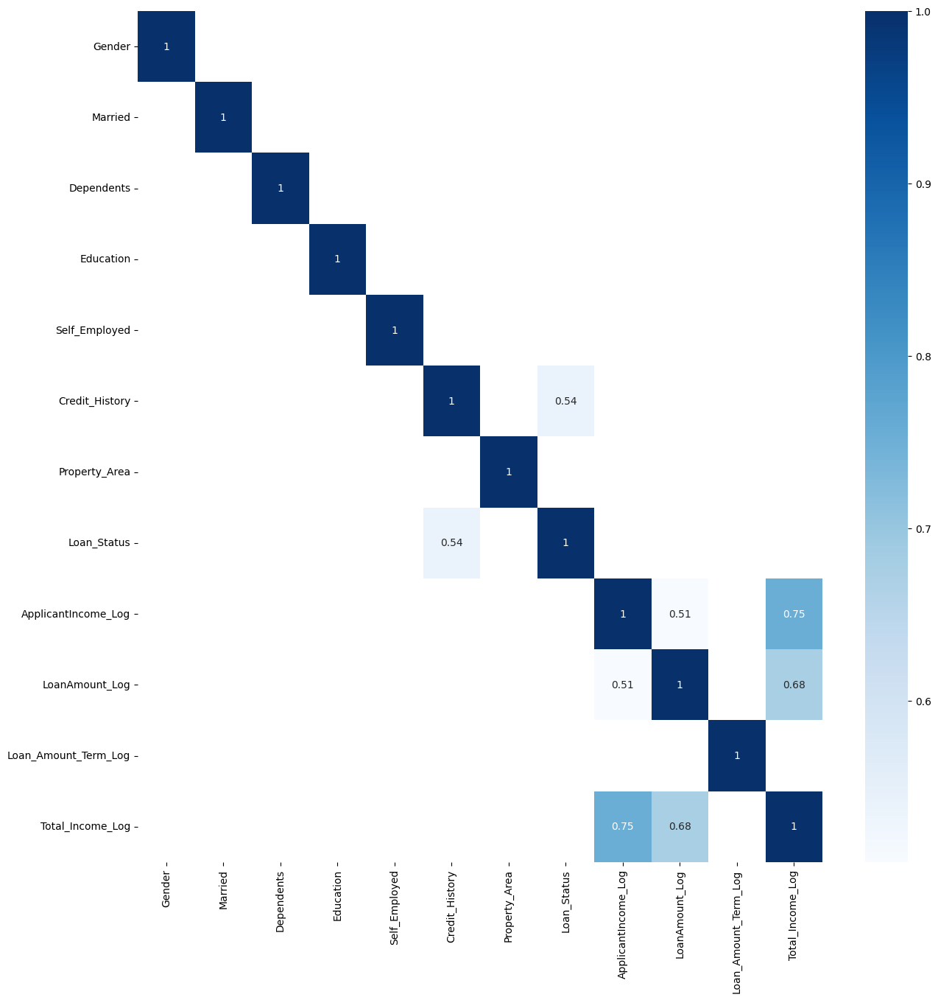

In [189]:
plt.figure(figsize=(15,15))
th = 0.5
sns.heatmap(encoded_df.corr()[encoded_df.corr() > th], annot=True, cmap='Blues')

<Axes: >

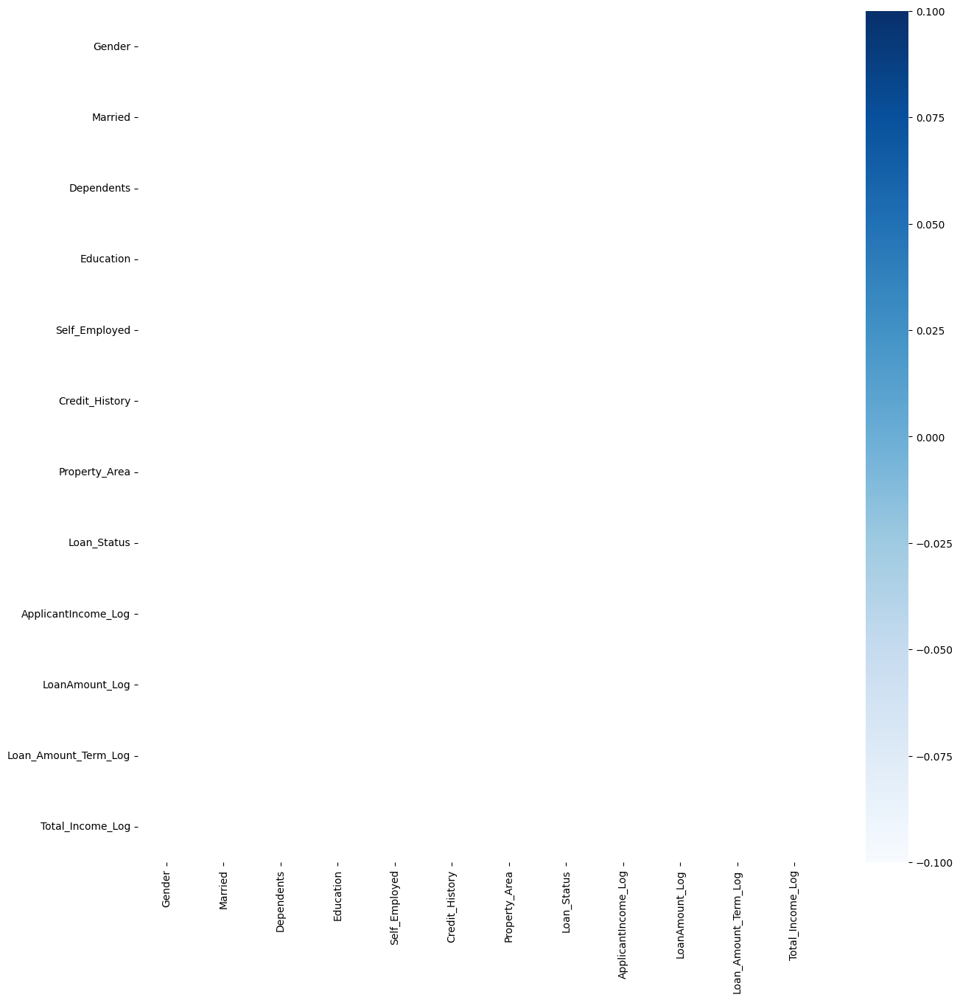

In [190]:
plt.figure(figsize=(15,15))
th = -0.5
sns.heatmap(encoded_df.corr()[encoded_df.corr() < th], annot=True, cmap='Blues')

### Variances

In [191]:
import numpy as np
variance_per_var = np.round(df.var().sort_values(ascending=False), 2)
variance_per_var

ApplicantIncome_Log     0.32
Total_Income_Log        0.24
LoanAmount_Log          0.19
Credit_History          0.12
Loan_Amount_Term_Log    0.10
dtype: float64

In [192]:
df[target_var].unique().size

2

<Axes: xlabel='Loan_Status', ylabel='Density'>

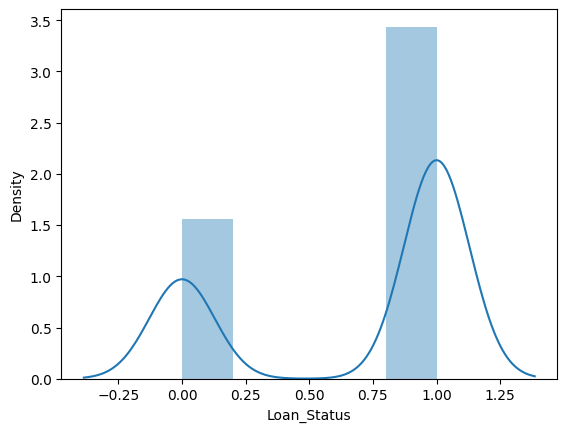

In [194]:
sns.distplot(encoded_df_sk[target_var])

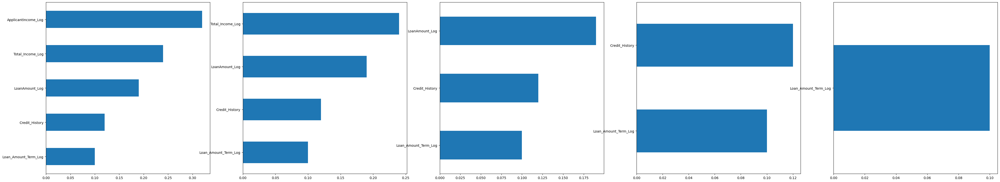

In [195]:
size = len(variance_per_var.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(variance_per_var.index):
  plt.subplot(rs, cs, i+1)
  variance_per_var[col_name:].sort_values(ascending=True).plot.barh();

In [196]:
encoded_df.var().sort_values(ascending=False).round(2)

Dependents              1.02
Property_Area           0.62
ApplicantIncome_Log     0.32
Total_Income_Log        0.24
Married                 0.23
Loan_Status             0.22
LoanAmount_Log          0.19
Education               0.17
Gender                  0.15
Credit_History          0.12
Self_Employed           0.12
Loan_Amount_Term_Log    0.10
dtype: float64

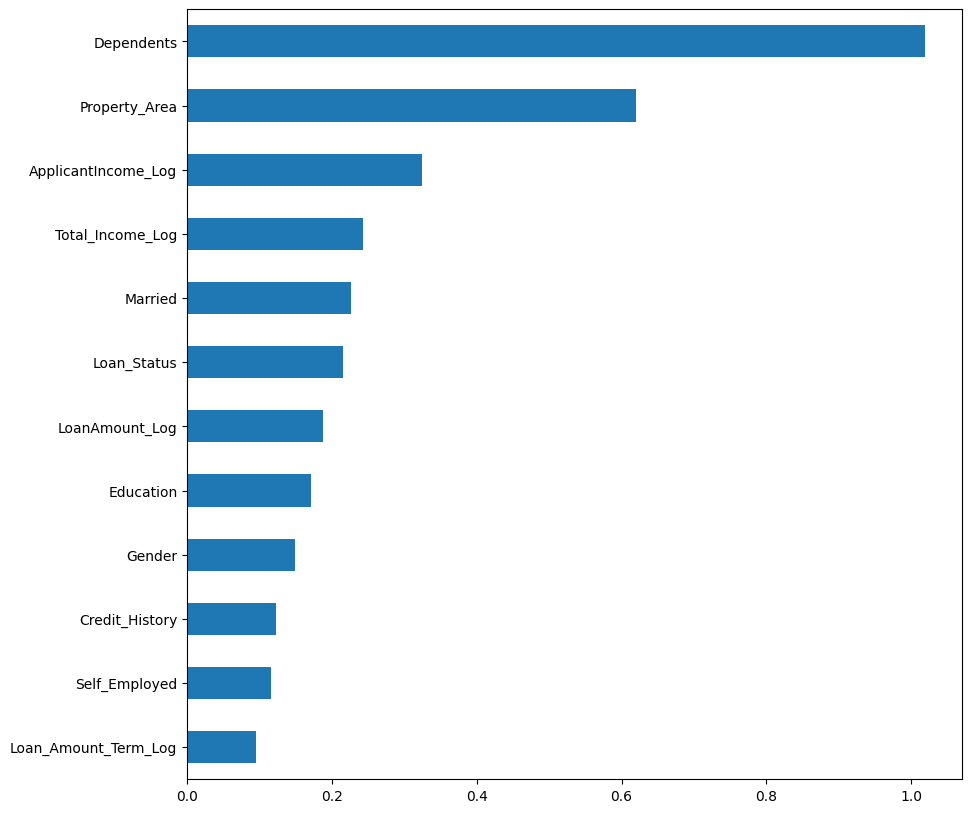

In [197]:
plt.figure(figsize=(10, 10))
encoded_df.var().sort_values(ascending=True).plot.barh();

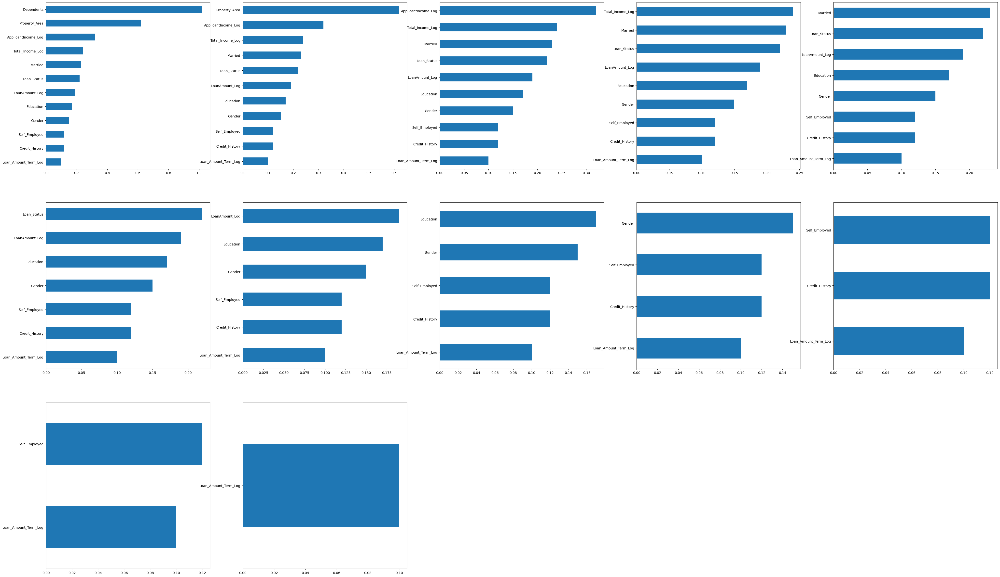

In [198]:
variance_per_var_enc = np.round(encoded_df.var().sort_values(ascending=False), 2)

size = len(variance_per_var_enc.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(variance_per_var_enc.index):
  plt.subplot(rs, cs, i+1)
  variance_per_var_enc[col_name:].sort_values(ascending=True).plot.barh();

### Covariance between target var

#### Way-1

In [199]:
def numerical_covariance(df, target_var):
    # Separate out numerical columns
    numerical_cols = df.select_dtypes(include=[int, float, "int8", bool]).columns

    # Create a copy of the DataFrame with only the numerical columns
    numerical_df = df[numerical_cols].copy()

    # If the target variable is categorical, encode it temporarily
    if df[target_var].dtype == 'object' or df[target_var].dtype == 'category':
        temp_encode = pd.get_dummies(df[target_var], prefix=target_var)
        numerical_df = pd.concat([numerical_df, temp_encode], axis=1)
        target_var = temp_encode.columns[0]

    # Calculate the covariance between each numerical column and the target variable
    covariances = numerical_df.cov()[target_var]

    # Return the result as a pandas Series
    return covariances

In [200]:
covariances = np.round(numerical_covariance(df, target_var),2)
covariances

Credit_History         -0.09
ApplicantIncome_Log    -0.00
LoanAmount_Log          0.01
Loan_Amount_Term_Log    0.00
Total_Income_Log       -0.00
Loan_Status_N           0.22
Loan_Status_Y          -0.22
Name: Loan_Status_N, dtype: float64

<Axes: >

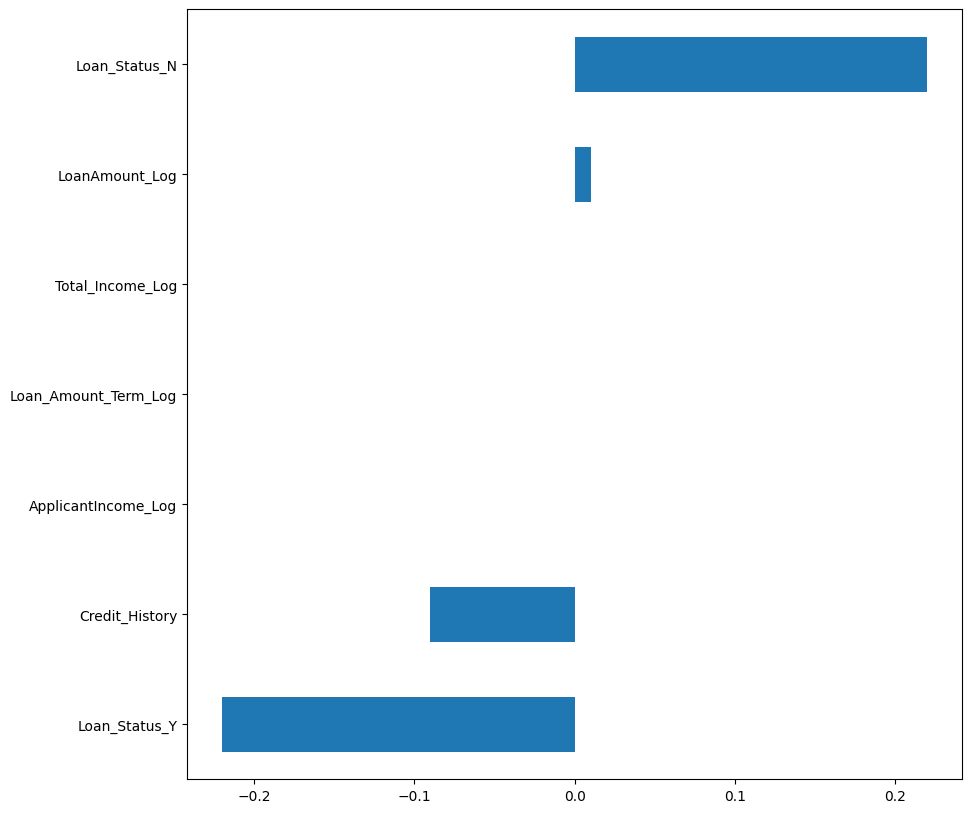

In [201]:
plt.figure(figsize=(10, 10))
covariances.sort_values(ascending=True).plot.barh()

<Axes: >

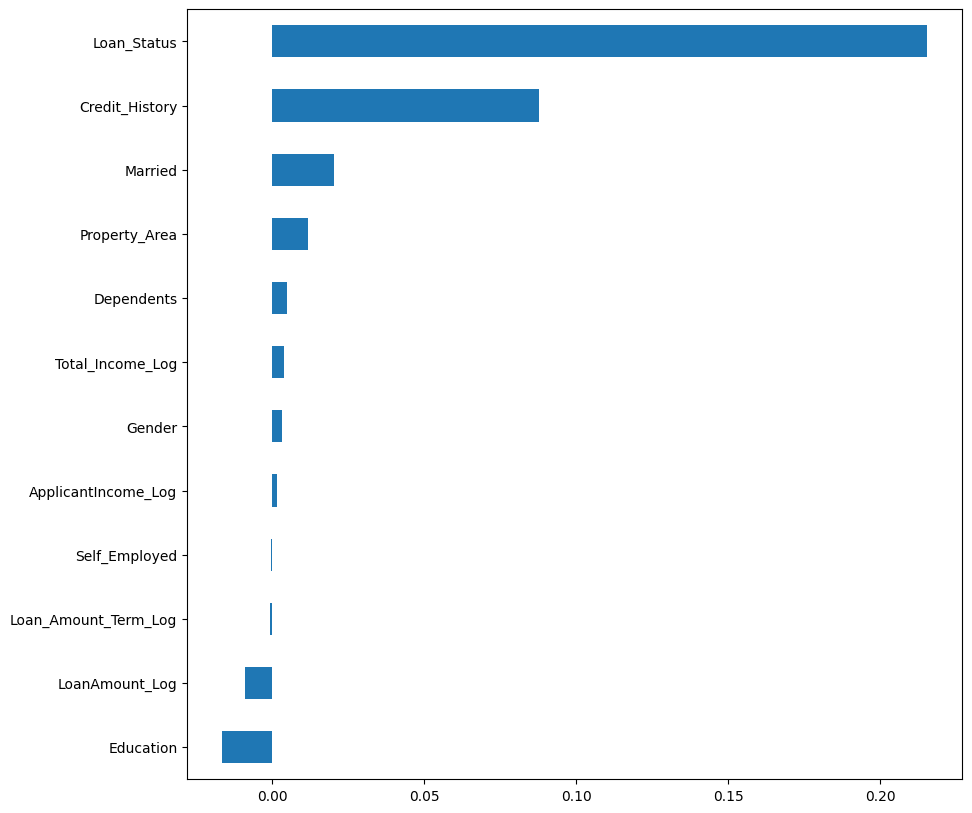

In [202]:
plt.figure(figsize=(10, 10))
numerical_covariance(encoded_df, target_var).sort_values(ascending=True).plot.barh()

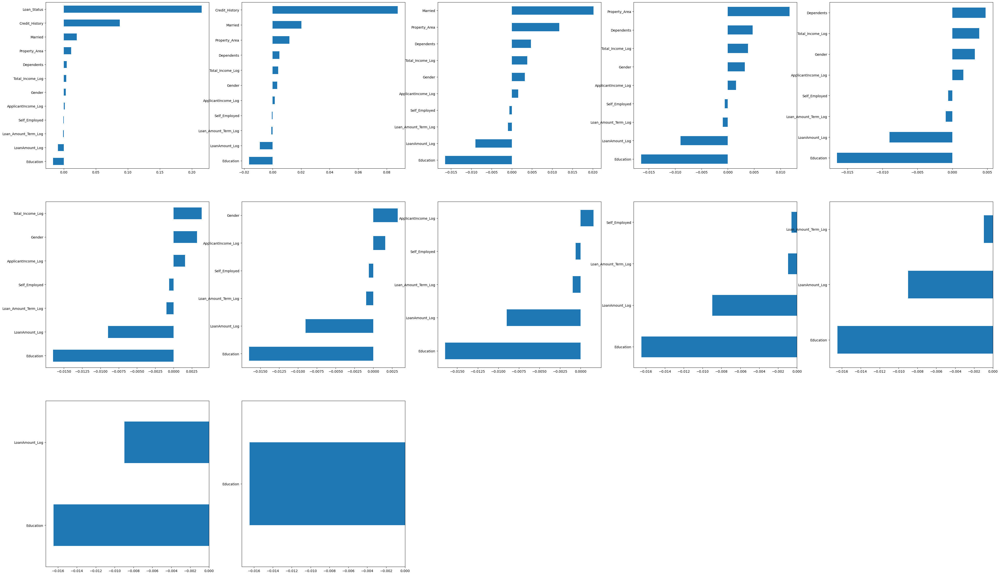

In [203]:
cov_target = numerical_covariance(encoded_df, target_var).sort_values(ascending=False)

size = len(cov_target.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(cov_target.index):
  plt.subplot(rs, cs, i+1)
  cov_target[col_name:].sort_values(ascending=True).plot.barh()

In [204]:

plt.figure(figsize=(10, 10))


<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

#### Way-2
```python
# Calculate the covariance between the target and the feature
cov = {  col: [ np.cov(df[target_var].cat.codes, df[col])[0,1] ] for col in num_cols }
cov_s = pd.Series(np.squeeze(list(cov.values())), index=cov.keys())
cov_s
```

# (E) Model Selection (Classic ML models)

## Prepare The Data To Training

### Encoding the categorical variables

#### Target variable

In [123]:
from sklearn.preprocessing import LabelEncoder
le_Loan_Status = LabelEncoder()

In [124]:
target_var

'Loan_Status'

In [125]:
df[target_var] = le_Loan_Status.fit_transform(df[target_var])
df.head()

,Gender,Married,Dependents,Education,Self_Employed,Credit_History,Property_Area,Loan_Status,ApplicantIncome_Log,LoanAmount_Log,Loan_Amount_Term_Log,Total_Income_Log
0,Male,No,0,Graduate,No,1.0,Urban,1,8.674197,4.866325,5.888878,8.674197
1,Male,Yes,1,Graduate,No,1.0,Rural,0,8.430327,4.859812,5.888878,8.714732
2,Male,Yes,0,Graduate,Yes,1.0,Urban,1,8.006701,4.204693,5.888878,8.006701
3,Male,Yes,0,Not Graduate,No,1.0,Urban,1,7.857094,4.795791,5.888878,8.505525
4,Male,No,0,Graduate,No,1.0,Urban,1,8.699681,4.955827,5.888878,8.699681


#### Features

In [126]:
df[cat_cols].head(2)

,Gender,Married,Dependents,Education,Self_Employed,Property_Area,Loan_Status
0,Male,No,0,Graduate,No,Urban,1
1,Male,Yes,1,Graduate,No,Rural,0


In [127]:
from sklearn.preprocessing import LabelEncoder

encoders = {}
for col in cat_cols:
  encoders[col] = LabelEncoder()
  df[col] = encoders[col].fit_transform(df[col])

In [128]:
df[cat_cols].head(2)

,Gender,Married,Dependents,Education,Self_Employed,Property_Area,Loan_Status
0,1,0,0,0,0,2,1
1,1,1,1,0,0,0,0


In [129]:
for col, encoder in encoders.items():
  print( f" {col:<15}   class: {encoder.classes_}")

 Gender            class: ['Female' 'Male']
 Married           class: ['No' 'Yes']
 Dependents        class: ['0' '1' '2' '3+']
 Education         class: ['Graduate' 'Not Graduate']
 Self_Employed     class: ['No' 'Yes']
 Property_Area     class: ['Rural' 'Semiurban' 'Urban']
 Loan_Status       class: [0 1]


In [130]:
# Appending the target encoder object for further usage
encoders["Loan_Status"] = le_Loan_Status

In [131]:
encoders["Gender"].transform([["Female"], ["Male"]])

array([0, 1])

In [132]:
encoders["Gender"].inverse_transform([[0],[1]])

array(['Female', 'Male'], dtype=object)

In [133]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                614 non-null    int64  
 1   Married               614 non-null    int64  
 2   Dependents            614 non-null    int64  
 3   Education             614 non-null    int64  
 4   Self_Employed         614 non-null    int64  
 5   Credit_History        614 non-null    float64
 6   Property_Area         614 non-null    int64  
 7   Loan_Status           614 non-null    int64  
 8   ApplicantIncome_Log   614 non-null    float64
 9   LoanAmount_Log        614 non-null    float64
 10  Loan_Amount_Term_Log  614 non-null    float64
 11  Total_Income_Log      614 non-null    float64
dtypes: float64(5), int64(7)
memory usage: 57.7 KB


### Splitting the dataset
```python
# train, test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

# train, validation split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20)
```

#### Denoting the Features and target variable

In [134]:
X = df.drop(columns=target_var)
y = df[target_var]

#### Train-Test Split

In [135]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

## Util Functions
- Utils functions for model tuning

### Greedy Step tune

In [147]:
from sklearn.model_selection import GridSearchCV
from pprint import pprint

def greedy_search(model, params:dict, X_train, y_train, cv=10, n_jobs=-1, verbose=2, is_print=False):
  """It tunes params individually step by step . select best value on current step.
  It assumes the params sorted by importance on the model as descending. 
  The important param, second important param, etc.... 
  """
  
  best_params = {}
  for name, values in params.items():
    # Initial params
    best_params[name] = values

    if is_print: print("before:");pprint(best_params);
    
    # create GridSearch&Train 
    cv_model = GridSearchCV(model, best_params, cv=cv, n_jobs=n_jobs, verbose=verbose)
    cv_model.fit(X_train, y_train)

    # Update the param
    best_params[name] = [cv_model.best_params_[name]]
    
    if is_print: print("after:");pprint(best_params);print("-"*25, end="\n\n");

  return cv_model, cv_model.best_estimator_, best_params

### Model Tuner

In [148]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report


def gen_clf_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common classification metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)

  clf_metrics = {
            "accuracy":accuracy_score(y_test, y_pred),
            "precision" : precision_score(y_test, y_pred, average="micro"),
            "recall": recall_score(y_test, y_pred, average="micro"),
            "f1_score": f1_score(y_test, y_pred, average="micro"),
            "clf_report":classification_report(y_test, y_pred, output_dict=True)
  }

  if return_y_data:
    clf_metrics["y_pred"] = y_pred
    clf_metrics["y_test"] = y_test
            
  
  return clf_metrics

In [149]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error, median_absolute_error

def gen_reg_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common regression metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)


  reg_metrics = {
      "MaxError": np.max(y_test - y_pred),
      "MeanAbsoluteError": median_absolute_error(y_test, y_pred),
      "MeanAbsolutePercentageError": np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
      "MSE": mean_squared_error(y_test, y_pred),
      "RMSE": mean_squared_error(y_test, y_pred, squared=False),
      "MAE": mean_absolute_error(y_test, y_pred),
      "R2":r2_score(y_test, y_pred),
      "ExplainedVariance":explained_variance_score(y_test, y_pred)
  }

  if return_y_data:
    reg_metrics["y_pred"] = y_pred
    reg_metrics["y_test"] = y_test


  return reg_metrics

In [150]:
import pandas as pd
def tune_models(tuners, X_train, y_train, X_test, y_test, is_clf, cv=10, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
    # Tuning
    cv_model, tuned_model, best_params = greedy_search(model, params, X_train, y_train, cv=cv)
    
    # predicting
    y_pred = tuned_model.predict(X_test)
    metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
    metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

    # Generating results
    cur_results = {
        "tune_results": {
            "cv_model":cv_model,
            "tuned_model":tuned_model,
            "best_params":best_params,
        },
        "metric_results": metric_results
    }
    
    results[name] = cur_results
    metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T


In [151]:
import pandas as pd
def tune_linear_cv_models(tuners, X_train, y_train, X_test, y_test, is_clf, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
      # Tuning
      tuned_model = model(**params)
      tuned_model.fit(X_train, y_train)
      
      # predicting
      y_pred = tuned_model.predict(X_test)
      metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
      metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

      # Generating results
      cur_results = {
          "tune_results": {
              "tuned_model":tuned_model,
              "best_params":tuned_model.get_params(True) ,#best_params_,
          },
          "metric_results": metric_results
      }
      
      results[name] = cur_results
      metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T

### Learning Curve Plotter

In [152]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve

def plot_learning_curve(model, name, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5), figsize=(20,20)):

    # checking the params
    if ylim is not None: plt.ylim(*ylim)
    
    # pre-declerations
    orange, blue = "#ff9124", "#2492ff"

    # Extracting the learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    # Extracting the scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # calculating params    
    tra_left_edge = train_scores_mean - train_scores_std
    tra_right_edge = train_scores_mean + train_scores_std

    test_left_edge = test_scores_mean - test_scores_std
    test_right_edge = test_scores_mean + test_scores_std

    # transparent plot for confidence value range
    plt.fill_between(train_sizes, tra_left_edge, tra_right_edge, alpha=0.1, color=orange)
    plt.fill_between(train_sizes, test_left_edge, test_right_edge, alpha=0.1, color=blue)
    
    # Plotting as point
    plt.plot(train_sizes, train_scores_mean, 'o-', color=orange, label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color=blue, label="Cross-validation score")
    
    # Configurating the plottings
    plt.title(f"{name} Learning Curve", fontsize=14)
    plt.xlabel('Training size (m)')
    plt.ylabel('Score')
    plt.grid(True)
    plt.legend(loc="best")

In [153]:
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier

def get_learning_curve_stats(clfs, X_train, y_train, cv, model_size, rs, cs, figsize, ylim):

  plt.figure(figsize=figsize)
  # EXtracting the learning curve and validation metrics
  best_models_cross_val_preds, roc_auc_scores = {}, {}
  for i, (name, model) in enumerate(clfs.items()):

    # Training with best models again (the best params already saved inside) for visualizate the duration.
    plt.subplot(rs, cs, i+1)
    print(f"{i}.turn [{name}], plotting learning curve")
    plot_learning_curve(model, name, X_train, y_train, ylim, cv=cv, n_jobs=-1, figsize=figsize) 

    # validating the trained models
    #print(f"{i}.turn, cross_validation")
    #method = "decision_function" if name in ["loj_reg", "svc"] else "predict"
    #best_models_cross_val_preds[name]  = cross_val_predict(model, X_train, y_train, cv=5, method=method)

    # Displating the roc scores
    #print(f"{i}.turn, roc_auc_scores")
    #roc_auc_scores[name] = roc_auc_score(y_train, best_models_cross_val_preds[name])
    #print(f'{name:<20}: ',roc_auc_scores[name])

  return plt.gcf()#, best_models_cross_val_preds#, roc_auc_scores

## (1) Linear Models

#### Hyperparams

In [154]:
lin_params = {
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'copy_X': [True, False],
}
from sklearn.linear_model import LinearRegression
linear_reg = [LinearRegression(), lin_params]

In [155]:
lasso_params = {
    "alphas": np.logspace(-4, 0, 100),
    #"cv": [3, 5, 10],
    #"normalize": True,
    #"tol": [1e-4, 1e-3, 1e-2]
}
from sklearn.linear_model import LassoCV
l1_reg = [LassoCV, lasso_params] 

In [156]:
ridge_params = {
    "alphas": (10**np.linspace(10,-2,100))*0.5,
    "scoring":"neg_mean_squared_error",
    #"normalize": True
}

from sklearn.linear_model import RidgeClassifierCV 
l2_reg = [RidgeClassifierCV, ridge_params]

In [157]:
ElasticNet_params = {
    "alphas": np.logspace(-4, 0, 100),
    #"cv": 10, #[3, 5, 10],
    #"normalize": True#[True, False],
    #"tol": [1e-4, 1e-3, 1e-2]
}

from sklearn.linear_model import ElasticNetCV 
enet_reg = [ElasticNetCV, ElasticNet_params]

In [158]:
linear_cv_tuners = {
    "l1_reg":l1_reg,
    "l2_reg":l2_reg,
    "enet_reg":enet_reg
}
linear_tuners = {
    "lin_reg":linear_reg,
    #**linear_cv_tuners
}

#### Tuning Demostration

In [159]:
lin_results, lin_metric_summary = tune_linear_cv_models(linear_cv_tuners, X_train, y_train, X_test , y_test, is_clf=False, is_round=True) # X_train_us, y_train_us, X_test_us, y_test_us,

In [160]:
list(lin_results.keys())

['l1_reg', 'l2_reg', 'enet_reg']

In [161]:
lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,1.0,0.0,inf,0.170732,0.413197,0.170732,0.130303,0.227609
l2_reg,0.0,0.0,inf,0.268293,0.517970,0.268293,-0.366667,0.000000
enet_reg,1.0,0.0,inf,0.170732,0.413197,0.170732,0.130303,0.227609


In [162]:
from pprint import pprint
pprint(lin_results)

{'enet_reg': {'metric_results': {'ExplainedVariance': 0.22760942760942737,
                                 'MAE': 0.17073170731707318,
                                 'MSE': 0.17073170731707318,
                                 'MaxError': 1,
                                 'MeanAbsoluteError': 0.0,
                                 'MeanAbsolutePercentageError': inf,
                                 'R2': 0.13030303030303048,
                                 'RMSE': 0.4131969352706687},
              'tune_results': {'best_params': {'alphas': array([1.00000000e-04, 1.09749877e-04, 1.20450354e-04, 1.32194115e-04,
       1.45082878e-04, 1.59228279e-04, 1.74752840e-04, 1.91791026e-04,
       2.10490414e-04, 2.31012970e-04, 2.53536449e-04, 2.78255940e-04,
       3.05385551e-04, 3.35160265e-04, 3.67837977e-04, 4.03701726e-04,
       4.43062146e-04, 4.86260158e-04, 5.33669923e-04, 5.85702082e-04,
       6.42807312e-04, 7.05480231e-04, 7.74263683e-04, 8.49753436e-04,
       9.32603347e-04,

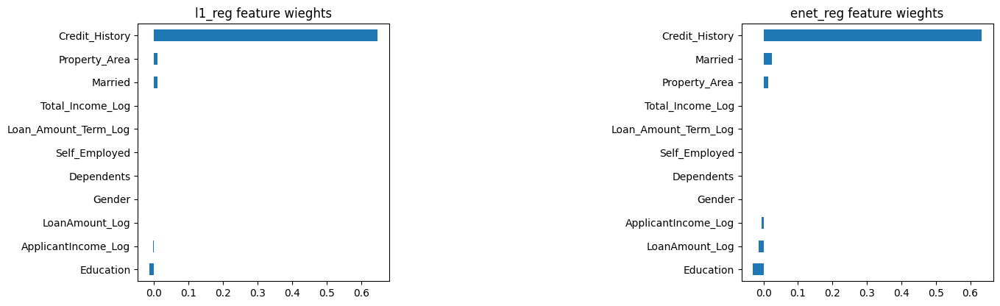

In [163]:
size = len(lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
lin_models = {}
for i, model_name in enumerate(lin_results.keys()):

  cur_model = lin_results[model_name]["tune_results"]["tuned_model"]
  lin_models[model_name] = cur_model
  
  if model_name not in ["l2_reg"]:
    plt.subplot(rs,cs,i+1)
    pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
    plt.title(f"{model_name} feature wieghts")

0.turn [l1_reg], plotting learning curve
1.turn [l2_reg], plotting learning curve
2.turn [enet_reg], plotting learning curve


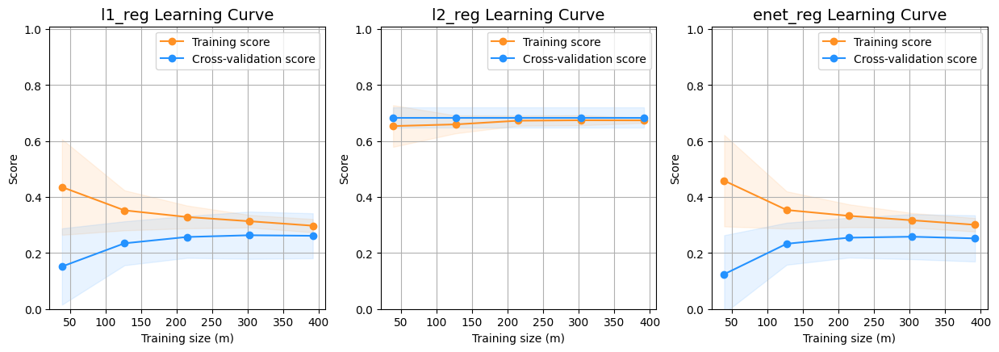

In [164]:
# Example Usage
model_size = len(lin_models)
rs, cs = (model_size//3+1, 3 ) if model_size >= 3 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_models, X_train, y_train,  **lcs_params)

In [165]:
lin_reg_results, lin_reg_metric_summary = tune_models(linear_tuners, X_train, y_train, X_test , y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits


In [166]:
list(lin_reg_results.keys())

['lin_reg']

In [167]:
lin_reg_metric_summary

,ExplainedVariance,MAE,MSE,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,R2,RMSE
lin_reg,0.227609,0.170732,0.170732,1.0,0.0,inf,0.130303,0.413197


In [168]:
from pprint import pprint
pprint(lin_reg_results)

{'lin_reg': {'metric_results': {'ExplainedVariance': 0.22760942760942737,
                                'MAE': 0.17073170731707318,
                                'MSE': 0.17073170731707318,
                                'MaxError': 1,
                                'MeanAbsoluteError': 0.0,
                                'MeanAbsolutePercentageError': inf,
                                'R2': 0.13030303030303048,
                                'RMSE': 0.4131969352706687},
             'tune_results': {'best_params': {'copy_X': [True],
                                              'fit_intercept': [False]},
                              'cv_model': GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True], 'fit_intercept': [False]},
             verbose=2),
                              'tuned_model': LinearRegression(fit_intercept=False)}}}


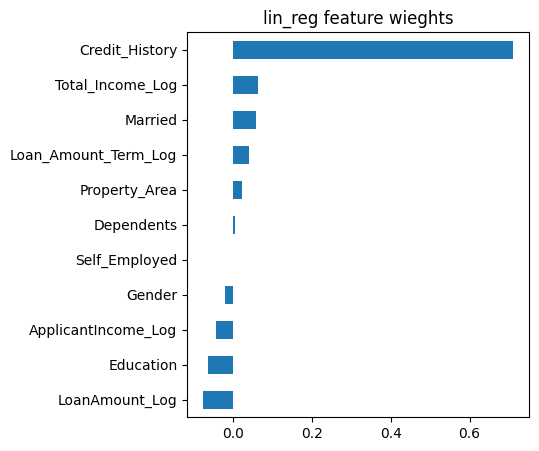

In [169]:
size = len(lin_reg_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
lin_reg_models = dict()
for i, model_name in enumerate(lin_reg_results.keys()):

  cur_model = lin_reg_results[model_name]["tune_results"]["tuned_model"]
  lin_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [lin_reg], plotting learning curve


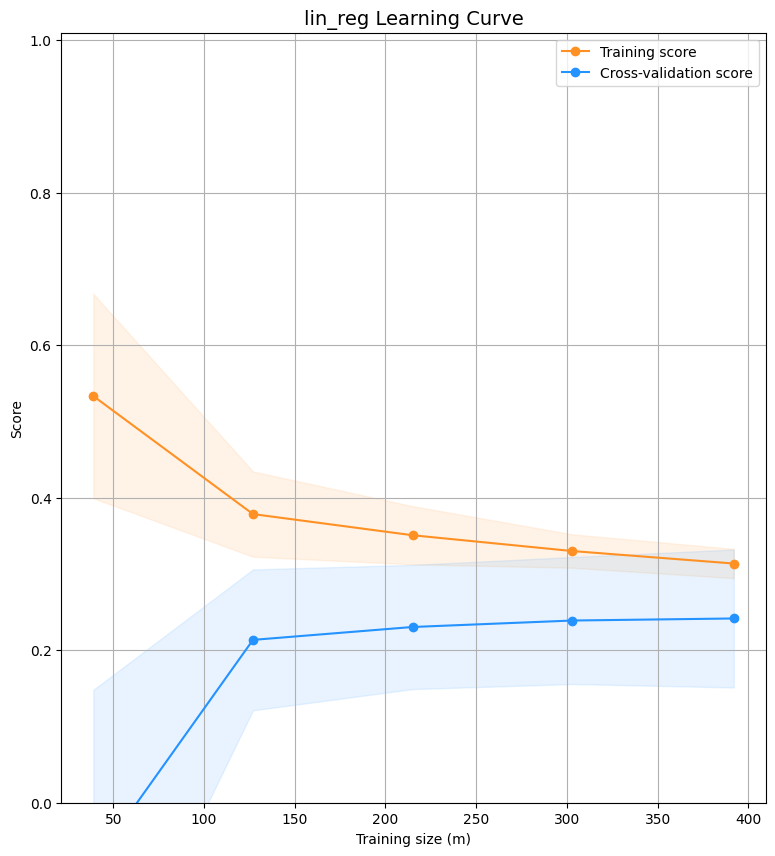

In [170]:
# Example Usage
model_size = len(lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_reg_models, X_train, y_train,**lcs_params)

## (2) Non-Linear Models 

#### Hyperparams

In [171]:
loj_params = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-3, 3, 7),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500],
    'fit_intercept': [True, False],
    'intercept_scaling': [0.5, 1, 2]
}
from sklearn.linear_model import LogisticRegression
loj_reg = [LogisticRegression(), loj_params]

In [172]:
nb_params = {
    "priors": [None, [0.1, 0.9], [0.2, 0.8], [0.3, 0.7], [0.4, 0.6], [0.5, 0.5]],
    "var_smoothing":  np.linspace(1e-6, 1e-12, 10)
}
from sklearn.naive_bayes import GaussianNB
nb = [GaussianNB(), nb_params]

In [173]:
knn_params = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50],
    'p': [1, 2, 3, 4, 5],
}
from sklearn.neighbors import KNeighborsClassifier
knn = [KNeighborsClassifier() , knn_params]

In [174]:
svc_params = {
    'C': np.logspace(-3, 3, 7),
    #'kernel': ["linear", "rbf"], # ['linear', 'poly', 'rbf', 'sigmoid'],
    #'degree': [2, 3, 4, 5],
    #'gamma': ['scale', 'auto'] + list(np.logspace(-3, 3, 7)),
    #'coef0': [-1, 0, 1],
    #'shrinking': [True, False],
    #'probability': [True, False],
    #'tol': [1e-3, 1e-4, 1e-5],
    #'max_iter': [-1, 1000, 10000, 100000],
    #"class_weight": [None, "balanced"]
}
from sklearn.svm import SVC
svc = [SVC() , svc_params]

In [175]:
dt_params = {
    "max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
    "splitter": ["best", "random"],
    "max_features": [None, "auto", "log2"],
    "class_weight": [None, "balanced"]
}
from sklearn.tree import DecisionTreeClassifier
dt = [DecisionTreeClassifier() , dt_params]

In [176]:
non_linear_tuners = {
    "loj_reg":loj_reg,
    "nb_params":nb,
    "knn":knn,
    "svc":svc,
    "dt":dt
}

#### Tuning Demostration



In [177]:
non_lin_results, non_lin_metric_summary = tune_models(non_linear_tuners, X_train, y_train, X_test , y_test, is_clf=True)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 6 candidates, totalling 60 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for e

In [178]:
list(non_lin_results.keys())

['loj_reg', 'nb_params', 'knn', 'svc', 'dt']

In [179]:
non_lin_metric_summary

,accuracy,precision,recall,f1_score,clf_report
loj_reg,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
nb_params,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
knn,0.772358,0.772358,0.772358,0.772358,"{'0': {'precision': 0.6666666666666666, 'recal..."
svc,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
dt,0.796748,0.796748,0.796748,0.796748,"{'0': {'precision': 0.7222222222222222, 'recal..."


In [180]:
from pprint import pprint
pprint(non_lin_results)

{'dt': {'metric_results': {'accuracy': 0.7967479674796748,
                           'clf_report': {'0': {'f1-score': 0.5098039215686274,
                                                'precision': 0.7222222222222222,
                                                'recall': 0.3939393939393939,
                                                'support': 33},
                                          '1': {'f1-score': 0.8717948717948718,
                                                'precision': 0.8095238095238095,
                                                'recall': 0.9444444444444444,
                                                'support': 90},
                                          'accuracy': 0.7967479674796748,
                                          'macro avg': {'f1-score': 0.6907993966817496,
                                                        'precision': 0.7658730158730158,
                                                        'recall': 0.6691919191919191

In [181]:
non_lin_reg_models = dict()
for i, model_name in enumerate(non_lin_results.keys()):

  cur_model = non_lin_results[model_name]["tune_results"]["tuned_model"]
  non_lin_reg_models[model_name] = cur_model

In [182]:
non_lin_reg_models

{'loj_reg': LogisticRegression(C=0.1, intercept_scaling=0.5, solver='newton-cg'),
 'nb_params': GaussianNB(priors=[0.1, 0.9], var_smoothing=1e-06),
 'knn': KNeighborsClassifier(leaf_size=10, n_neighbors=13, p=3, weights='distance'),
 'svc': SVC(C=10.0),
 'dt': DecisionTreeClassifier(max_depth=5, min_samples_leaf=3)}

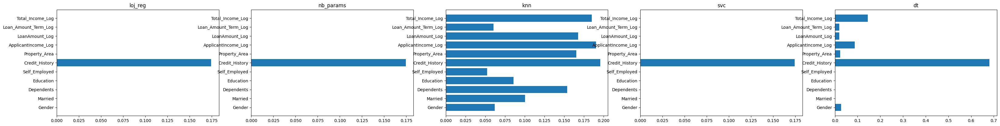

In [183]:
from sklearn.inspection import permutation_importance

size = len(non_lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//4+1, 4)

plt.figure(figsize=(cs*8, rs*5))
# plot feature importance for each model
for i, (name, model) in enumerate(non_lin_reg_models.items()):
    
    # Extracting the importance
    if hasattr(model, 'feature_importances_'):
        # for tree-based models
        importances = model.feature_importances_
    else:
        # for non-tree-based models
        result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=0)
        importances = result.importances_mean
    
    plt.subplot(rs,cs,i+1)
    plt.barh( X_train.columns, importances)
    plt.title(name)
    #plt.yticks(range(len(indices)), [f'feature {i+1}' for i in indices])
    #plt.xlabel('Relative Importance')


0.turn [loj_reg], plotting learning curve
1.turn [nb_params], plotting learning curve
2.turn [knn], plotting learning curve
3.turn [svc], plotting learning curve
4.turn [dt], plotting learning curve


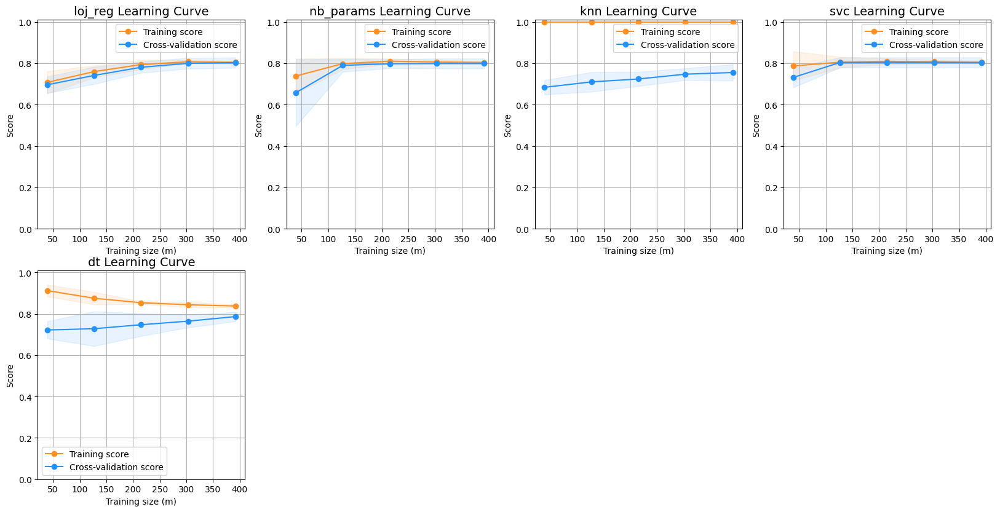

In [184]:
# Example Usage
model_size = len(non_lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(non_lin_reg_models, X_train, y_train,  **lcs_params)

## (3) Ensemble Models

#### Hyperparams

In [185]:
# Defining parameters
rf_params = {
    "n_estimators": [10, 50, 100, 200],
    "criterion": ["gini", "entropy"],
    #"max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    #"max_features": [None, "auto", "log2"],
    #"class_weight": [None, "balanced"],
    #"bootstrap": [True, False],
    #"oob_score": [True, False],
    #"n_jobs": [None, -1, 1]
}
from sklearn.ensemble import RandomForestClassifier
rf = [RandomForestClassifier(), rf_params] 

In [186]:
# Defining parameters
gbc_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'max_depth': [3, 5, 7],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4],
    #'max_features': ['auto', 'sqrt', 'log2'],
    #'subsample': [0.7, 0.8, 0.9]
}
from sklearn.ensemble import GradientBoostingClassifier
gbc = [GradientBoostingClassifier(), gbc_params] 

In [187]:
# Defining parameters
xgbc_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'max_depth': [3, 5, 7],
    'min_child_weight': [1, 2, 4],
    #'gamma': [0, 0.1, 0.2],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from xgboost import XGBClassifier
xgbc = [XGBClassifier(), xgbc_params] 

In [188]:
# Defining parameters
lgbm_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'num_leaves': [31, 63, 127],
    #'max_depth': [3, 5, 7],
    'min_child_samples': [10, 20, 30],
    #'min_child_weight': [1e-3, 1e-2, 1e-1],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from lightgbm import LGBMClassifier
lgbm = [LGBMClassifier(), lgbm_params] 

In [189]:
!pip install catboost
import os
if os.system("pip freeze | grep catboost==") != 0: os.system("pip install catboost")

cb_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'depth': [3, 5, 7],
    #'l2_leaf_reg': [1, 2, 4],
    #'boosting_type': ['Ordered', 'Plain', 'Pointwise'],
    #'colsample_bylevel': [0.7, 0.8, 0.9],
    #'reg_lambda': [0, 1e-1, 1] # or # 'l2_leaf_reg': [1, 2, 4]
}
from catboost import CatBoostClassifier
cb = [CatBoostClassifier(), cb_params] 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 13.6 MB/s eta 0:00:00


In [190]:
ensemble_tuners = {
    "rf":rf,
    "gbc":gbc,
    "xgbc":xgbc,
    "lgbm":lgbm,
    "cb":cb
}

#### Tuning Demostration

In [191]:
ensemble_results, ensemble_metric_summary = tune_models(ensemble_tuners,  X_train, y_train, X_test , y_test, is_clf=True)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
0:	learn: 0.6882343	total: 47.6ms	remaining: 47.5s
1:	learn: 0.6827216	total: 49.4ms	

In [192]:
list(ensemble_results)

['rf', 'gbc', 'xgbc', 'lgbm', 'cb']

In [193]:
ensemble_metric_summary

,accuracy,precision,recall,f1_score,clf_report
rf,0.821138,0.821138,0.821138,0.821138,"{'0': {'precision': 0.8235294117647058, 'recal..."
gbc,0.821138,0.821138,0.821138,0.821138,"{'0': {'precision': 0.8235294117647058, 'recal..."
xgbc,0.780488,0.780488,0.780488,0.780488,"{'0': {'precision': 0.6071428571428571, 'recal..."
lgbm,0.813008,0.813008,0.813008,0.813008,"{'0': {'precision': 0.7777777777777778, 'recal..."
cb,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."


In [194]:
from pprint import pprint
pprint(ensemble_results)

{'cb': {'metric_results': {'accuracy': 0.8292682926829268,
                           'clf_report': {'0': {'f1-score': 0.5714285714285714,
                                                'precision': 0.875,
                                                'recall': 0.42424242424242425,
                                                'support': 33},
                                          '1': {'f1-score': 0.8934010152284264,
                                                'precision': 0.822429906542056,
                                                'recall': 0.9777777777777777,
                                                'support': 90},
                                          'accuracy': 0.8292682926829268,
                                          'macro avg': {'f1-score': 0.7324147933284989,
                                                        'precision': 0.8487149532710281,
                                                        'recall': 0.701010101010101,
            

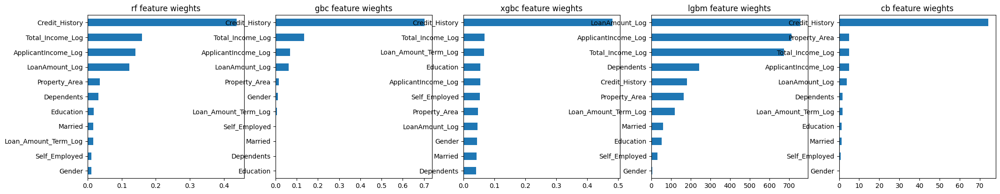

In [195]:
es_model_names = [col for col in ensemble_results.keys() if col not in ["bag_reg"]]
size = len(es_model_names)
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
ensemble_reg_models = dict()
for i, model_name in enumerate(es_model_names):
  if model_name in ["bag_reg"]: continue

  cur_model = ensemble_results[model_name]["tune_results"]["tuned_model"]
  ensemble_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.feature_importances_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [rf], plotting learning curve
1.turn [gbc], plotting learning curve
2.turn [xgbc], plotting learning curve
3.turn [lgbm], plotting learning curve
4.turn [cb], plotting learning curve


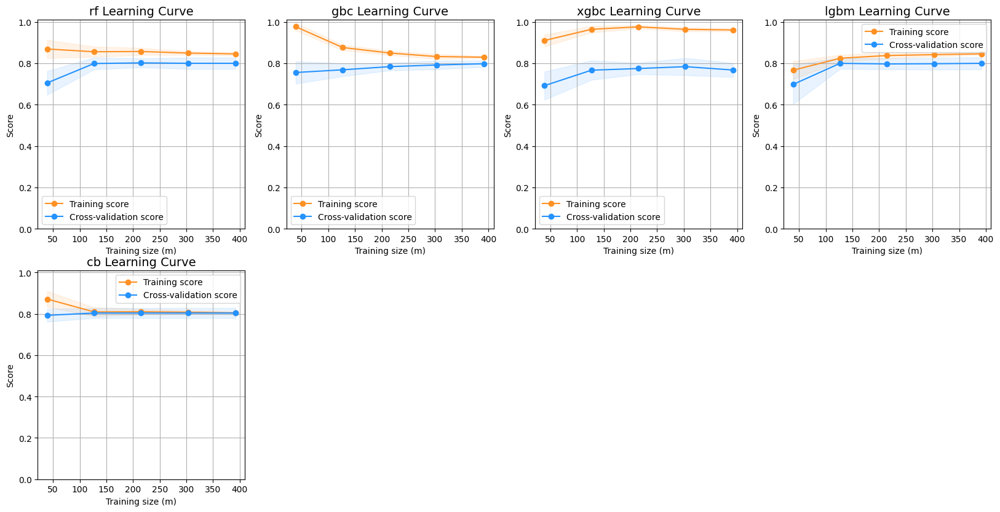

In [196]:
# Example Usage
model_size = len(ensemble_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv": ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(ensemble_reg_models, X_train, y_train,  **lcs_params)

## (4) Final Model

### Top models

In [197]:
# lin_results, lin_metric_summary
# lin_reg_results, lin_reg_metric_summary
# non_lin_results, non_lin_metric_summary
# ensemble_results, ensemble_metric_summary

In [198]:
all_results = [lin_results, lin_reg_results, non_lin_results, ensemble_results]

In [199]:
lin_models = pd.concat([lin_metric_summary, lin_reg_metric_summary])
lin_models = lin_models.sort_values(by=['MSE'], ascending=True)
lin_models

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,1.0,0.0,inf,0.170732,0.413197,0.170732,0.130303,0.227609
enet_reg,1.0,0.0,inf,0.170732,0.413197,0.170732,0.130303,0.227609
lin_reg,1.0,0.0,inf,0.170732,0.413197,0.170732,0.130303,0.227609
l2_reg,0.0,0.0,inf,0.268293,0.517970,0.268293,-0.366667,0.000000


In [200]:
non_linear_model = pd.concat([non_lin_metric_summary, ensemble_metric_summary])
non_linear_model = non_linear_model.sort_values(by=['accuracy','f1_score'],  ascending=False)
non_linear_model

,accuracy,precision,recall,f1_score,clf_report
loj_reg,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
nb_params,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
svc,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
cb,0.829268,0.829268,0.829268,0.829268,"{'0': {'precision': 0.875, 'recall': 0.4242424..."
rf,0.821138,0.821138,0.821138,0.821138,"{'0': {'precision': 0.8235294117647058, 'recal..."
gbc,0.821138,0.821138,0.821138,0.821138,"{'0': {'precision': 0.8235294117647058, 'recal..."
lgbm,0.813008,0.813008,0.813008,0.813008,"{'0': {'precision': 0.7777777777777778, 'recal..."
dt,0.796748,0.796748,0.796748,0.796748,"{'0': {'precision': 0.7222222222222222, 'recal..."
xgbc,0.780488,0.780488,0.780488,0.780488,"{'0': {'precision': 0.6071428571428571, 'recal..."
knn,0.772358,0.772358,0.772358,0.772358,"{'0': {'precision': 0.6666666666666666, 'recal..."


In [201]:
non_linear_model.index

Index(['loj_reg', 'nb_params', 'svc', 'cb', 'rf', 'gbc', 'lgbm', 'dt', 'xgbc',
       'knn'],
      dtype='object')

### Final Model

### Greedy Selection

In [202]:
best_model_name = non_linear_model.iloc[0].name
best_model_name

'loj_reg'

In [219]:
tuned_model, best_params = None, None
for results in all_results:
  if best_model_name in results:
      tuned_model = results[best_model_name]["tune_results"]["tuned_model"]
      best_params = results[best_model_name]["tune_results"]["best_params"]

In [204]:
tuned_model.score(X_test, y_test)

0.8292682926829268

# (F) Saving & Downloading the model

### Saving the model

In [226]:
for results in all_results:
  print(results.keys())

dict_keys(['l1_reg', 'l2_reg', 'enet_reg'])
dict_keys(['lin_reg'])
dict_keys(['loj_reg', 'nb_params', 'knn', 'svc', 'dt'])
dict_keys(['rf', 'gbc', 'xgbc', 'lgbm', 'cb'])


In [222]:
results.keys()

dict_keys(['loj_reg', 'nb_params', 'knn', 'svc', 'dt'])

In [229]:
tuned_model, best_params = None, None
for results in all_results:
  if best_model_name in results:
      tuned_model = all_results[-1]["lgbm"]["tune_results"]["tuned_model"]
      best_params = all_results[-1]["lgbm"]["tune_results"]["best_params"]

In [230]:
import pickle
model_save_path = 'lgbm_model.sav'
pickle.dump(tuned_model, open(model_save_path, 'wb'))

In [231]:
import json

# Extracting the encodings of categorical variables 
classes = dict()
for col, encoder in encoders.items():
  classes[col] = {i:cls for i, cls in enumerate(encoder.classes_)}

# Saving the cat encodings
endoing_json_path = "cat_encods.json"
with open(endoing_json_path,"w+") as f: json.dump(classes, f)

In [232]:
imverse_class = {}
for col, clss in classes.items():
  imverse_class[col]  = {val:key for key, val in clss.items()}

### Loading the model

In [233]:
loaded_model = pickle.load(open(model_save_path, 'rb'))

In [234]:
loaded_model.score(X_test, y_test)

0.8130081300813008

In [211]:
import json

# loading the encodings of categorical variables
loaded_cls_enc = json.load(open(endoing_json_path, "r"))
loaded_cls_enc 

{'Gender': {'0': 'Female', '1': 'Male'},
 'Married': {'0': 'No', '1': 'Yes'},
 'Dependents': {'0': '0', '1': '1', '2': '2', '3': '3+'},
 'Education': {'0': 'Graduate', '1': 'Not Graduate'},
 'Self_Employed': {'0': 'No', '1': 'Yes'},
 'Property_Area': {'0': 'Rural', '1': 'Semiurban', '2': 'Urban'},
 'Loan_Status': {'0': 'N', '1': 'Y'}}

### Zipping the model
```python
import os 
zip_dst, src = f"{model_save_path}.zip", model_save_path
os.system(f"zip -r {zip_dst} {src}" )
```

### Downloading the model

In [235]:
from google.colab import files
files.download(model_save_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# (G) Deployment as App

## APP (loading from file)

### Declerations & Util Funcs

In [ ]:
!pip install gradio
import gradio as gr

In [ ]:
import pickle
import json 
import numpy as np

# File Paths
model_path = 'lgbm_model.sav'
endoing_path = "cat_encods.json"
component_config_path = "component_configs.json"

# predefined
indexes = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log']
cat_cols = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area','Loan_Status']
num_cols = ['Credit_History', 'ApplicantIncome_Log', 'LoanAmount_Log','Loan_Amount_Term_Log', 'Total_Income_Log']

target = "Loan_Status"

feature_order = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

classes = json.load(open(endoing_path, "r"))
inverse_class = {col:{val:key for key, val in clss.items()}  for col, clss in classes.items()}

labels = classes["Loan_Status"].values()

feature_limitations = json.load(open(component_config_path, "r"))

In [ ]:
import pandas as pd

def decode(col, data):
  return classes[col][data]

def encode(col, str_data):
  return inverse_class[col][str_data]

def feature_decode(df):

  # exclude the target var
  cat_cols = list(classes.keys())
  cat_cols.remove("Loan_Status")

  for col in cat_cols:
     df[col] = decode(col, df[col])

  return df

def feature_encode(df):
  
  # exclude the target var
  cat_cols = list(classes.keys())
  cat_cols.remove("Loan_Status")
  
  for col in cat_cols:
     df[col] = encode(col, df[col])
  
  return df

In [ ]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=indexes)
  features = feature_encode(features)
  features = np.array(features).reshape(-1,11)

  # prediction
  probabilities = model.predict_proba(features) #.predict(features)
  probs = probabilities.flatten()

  # output form
  results = {l : np.round(p, 3) for l, p in zip(labels, probs)}

  return results

In [ ]:
ex_data = ["Male", "No", "0", "Graduate", "No", "1", "Urban",5850, 129, 361, 5850]
predict(*ex_data)

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


{'N': 0.264, 'Y': 0.736}

### Declerating the components

In [ ]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:217: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:89: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(


### Launching the demo app

In [ ]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "label").launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

## Manuels (with out file, code form)

### Declerations & Util Funcs

In [ ]:
!pip install gradio
import gradio as gr

In [ ]:
import pickle
import json 
import numpy as np
import pandas as pd

# File Paths
model_path = 'finalized_model.sav'
endoing_path = "cat_encods.json"
component_config_path = "component_configs.json"

# predefined
indexes = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log']
cat_cols = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area','Loan_Status']
num_cols = ['Credit_History', 'ApplicantIncome_Log', 'LoanAmount_Log','Loan_Amount_Term_Log', 'Total_Income_Log']

target = "Loan_Status"



feature_order = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Credit_History', 'Property_Area', 'ApplicantIncome_Log',
       'LoanAmount_Log', 'Loan_Amount_Term_Log', 'Total_Income_Log']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

classes = json.load(open(endoing_path, "r"))
inverse_class = {col:{val:key for key, val in clss.items()}  for col, clss in classes.items()}

labels = classes["Loan_Status"].values()

#feature_limitations = json.load(open(component_config_path, "r"))

In [ ]:
def decode(col, data):
  return classes[col][data]

def encode(col, str_data):
  return inverse_class[col][str_data]

def feature_decode(df):

  # exclude the target var
  cat_cols = list(classes.keys())
  cat_cols.remove("Loan_Status")

  for col in cat_cols:
     df[col] = decode(col, df[col])

  return df

def feature_encode(df):
  
  # exclude the target var
  cat_cols = list(classes.keys())
  cat_cols.remove("Loan_Status")
  
  for col in cat_cols:
     df[col] = encode(col, df[col])
  
  return df

In [ ]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=indexes)
  features = feature_encode(features)
  features = np.array(features).reshape(-1,11)

  # prediction
  probabilities = model.predict_proba(features) #.predict(features)
  probs = probabilities.flatten()

  # output form
  results = {l : np.round(p, 3) for l, p in zip(labels, probs)}

  return results

### Extracting the input params

In [ ]:
tfm_cols = [
'ApplicantIncome_Log',
'CoapplicantIncome_Log',
'LoanAmount_Log',
'Loan_Amount_Term_Log',
'Total_Income_Log'
]

['ApplicantIncome_Log',
 'CoapplicantIncome_Log',
 'LoanAmount_Log',
 'Loan_Amount_Term_Log',
 'Total_Income_Log']

In [ ]:
val_ex = {
    'Gender': 1.0,
    'Married': 0.0,
    'Dependents': 0.0,
    'Education': 0.0,
    'Self_Employed': 0.0,
    'Credit_History': 1.0,
    'Property_Area': 2.0,
    'Loan_Status': 1.0,
    'ApplicantIncome_Log': 8.674196940225903,
    'LoanAmount_Log': 4.866324565936641,
    'Loan_Amount_Term_Log': 5.888877958332881,
    'Total_Income_Log': 8.674196940225903
}
def_val_ex = pd.Series(val_ex)

In [ ]:
import numpy as np
num_limitations = {}
for col in num_cols:
  if col in tfm_cols:
    # Inverse log transformation, so it is exp transformation
    re_trmd = np.exp(df[col])
    
    num_limitations[col] = {
        "min": np.floor(re_trmd.min()),
        "max": np.ceil(re_trmd.max()),
        "def": np.floor(np.exp(def_val_ex[col]))
    }
  else:
    num_limitations[col] = {
        "min": np.floor(df[col].min()),
        "max": np.ceil(df[col].max()),
        "def": np.floor(def_val_ex[col])
    }

In [ ]:
cat_limitations ={}
for col in cat_cols:
  cat_limitations[col] = {
      "values": list(classes[col].values()),
      "def": decode(col, def_val_ex[col])
  }

In [ ]:
total_limitations = {
    "num":num_limitations,
    "cat":cat_limitations
}

In [ ]:
feature_limitations = total_limitations.copy()
# removing target classes
del feature_limitations["cat"]["Loan_Status"]

In [ ]:
with open(component_config_path,"w+") as f: json.dump(feature_limitations, f)

In [ ]:
print(json.dumps(feature_limitations, indent=4))

### Declerating the components

In [ ]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [ ]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "label").launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>